# Goldsmiths University of London
# MSc Data Science and Artificial Intelligence
# Final Project in Data Science (2023-24)
# Supervisor: Dr V L Raju Chinthalapati
# Author: Alperen Unal - aunal001
# Student ID: 33804283

## Phase 1: Data Preprocessing & Feature Engineering

## 1. Utilising Modules

In [1]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBRegressor
from xgboost import plot_importance

## 2. Loading and Initial Preprocessing The Data

Loading fetched datasets via API from VeloData

In [3]:
btcusdt_spot = pd.read_csv("btcusdt_spot_velo_1hour_010121.csv")
ethusdt_spot = pd.read_csv("ethusdt_spot_velo_1hour_010121.csv")
btcusdt_futures = pd.read_csv("btcusdt_futures_velo_1hour_010121.csv")
ethusdt_futures = pd.read_csv("ethusdt_futures_velo_1hour_010121.csv")

### 2.1. Creating ETF Event Date Data

The ETF dataset was created by identifying ETF names listed on the Blockworks website. The announcement date for each ETF event was retrieved from the official websites of the respective ETF issuers and manually added to the dataset to accurately track ETF events in the cryptocurrency market. The dataset contains important dates and relevant information about various ETFs and associated cryptocurrencies (BTC or ETH).

In [5]:
# Loading manually created ETF data
etf_df = pd.read_csv('ETF_List_sorted.csv')
etf_df

,timestamp,Company,Currency,Trade
0,2017-11-22,Bitwise 10 Crypto Index Fund,ETH,Spot
1,2021-03-26,VanEck Ethereum Strategy ETF,ETH,Spot
2,2021-10-21,Valkyrie Bitcoin and Ether Strategy ETF,ETH,Futures
3,2021-11-15,Global X Blockchain & Bitcoin Strategy ETF,BTC,Futures
4,2021-11-18,ProShares Bitcoin Strategy ETF,BTC,Futures
5,2021-11-21,Valkyrie Bitcoin and Ether Strategy ETF,BTC,Futures
6,2022-09-15,Hashdex Bitcoin Futures ETF,BTC,Futures
7,2023-02-10,ProShares Ether Strategy ETF,ETH,Spot
8,2023-03-20,Bitwise Bitcoin Strategy Optimum Yield ETF,BTC,Futures
9,2023-09-29,Bitwise Ethereum Strategy ETF,ETH,Spot


In [6]:
df = etf_df
df.drop(columns=['Company', 'Trade'], inplace=True)

# The first row was removed because it was an ETF event that
# took place before the start date of the historical data we will analyze.
df = df.iloc[1:].reset_index(drop=True)

# Converting 'timestamp' column to datetime format.
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Creating 'btc_etf' and 'eth_etf' columns based on 'Currency' column.
df['btc_etf'] = df['Currency'].apply(lambda x: 1 if x == 'BTC' else 0)
df['eth_etf'] = df['Currency'].apply(lambda x: 1 if x == 'ETH' else 0)

# Filtering data between the specified start and end dates.
start_date = '2021-01-01 00:00:00'
end_date = '2024-07-30 18:00:00'
df = df[(df['timestamp'] >= start_date) & (df['timestamp'] <= end_date)]

# The 'timestamp' column is unique by adding a small delta to duplicates.
df['timestamp'] += pd.to_timedelta(df.groupby('timestamp').cumcount(), unit='s')

# Resampling to hourly frequency with all missing hours filled with 0.
all_hours = pd.date_range(start=start_date, end=end_date, freq='H')
df = df.set_index('timestamp').reindex(all_hours, fill_value=0).reset_index()
df.rename(columns={'index': 'timestamp'}, inplace=True)

# For each day where btc_etf or eth_etf was 1, it remains 1 for all hours.
df['btc_etf'] = df.groupby(df['timestamp'].dt.date)['btc_etf'].transform('max')
df['eth_etf'] = df.groupby(df['timestamp'].dt.date)['eth_etf'].transform('max')

# 'timestamp' column to 'YYYY-MM-DD hh:mm:ss'
df['timestamp'] = df['timestamp'].dt.strftime('%Y-%m-%d %H:%M:%S')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31363 entries, 0 to 31362
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   timestamp  31363 non-null  object
 1   Currency   31363 non-null  object
 2   btc_etf    31363 non-null  int64 
 3   eth_etf    31363 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 980.2+ KB


In [7]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df

,timestamp,Currency,btc_etf,eth_etf
0,2021-01-01 00:00:00,0,0,0
1,2021-01-01 01:00:00,0,0,0
2,2021-01-01 02:00:00,0,0,0
3,2021-01-01 03:00:00,0,0,0
4,2021-01-01 04:00:00,0,0,0
...,...,...,...,...
31358,2024-07-30 14:00:00,0,0,0
31359,2024-07-30 15:00:00,0,0,0
31360,2024-07-30 16:00:00,0,0,0
31361,2024-07-30 17:00:00,0,0,0


In [8]:
df.drop(columns='Currency', inplace=True)
df.rename(columns={'timestamp': 'time'}, inplace=True)
df['time'] = pd.to_datetime(df['time'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31363 entries, 0 to 31362
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   time     31363 non-null  datetime64[ns]
 1   btc_etf  31363 non-null  int64         
 2   eth_etf  31363 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 735.2 KB


In [9]:
# Monitoring the event day to ensure all the btc_etf data is '1'.
nov_15_rows = df[df['time'].dt.date == pd.to_datetime('2021-11-15').date()]
nov_15_rows

,time,btc_etf,eth_etf
7632,2021-11-15 00:00:00,1,0
7633,2021-11-15 01:00:00,1,0
7634,2021-11-15 02:00:00,1,0
7635,2021-11-15 03:00:00,1,0
7636,2021-11-15 04:00:00,1,0
7637,2021-11-15 05:00:00,1,0
7638,2021-11-15 06:00:00,1,0
7639,2021-11-15 07:00:00,1,0
7640,2021-11-15 08:00:00,1,0
7641,2021-11-15 09:00:00,1,0


### 2.2. Cumulative Volume Delta Calculation

In [10]:
# Net Volume Delta ('NVD')
btcusdt_spot['NVD'] = btcusdt_spot['buy_coin_volume'] - btcusdt_spot['sell_coin_volume']
btcusdt_spot['CVD'] = btcusdt_spot['NVD'].cumsum()

ethusdt_spot['NVD'] = ethusdt_spot['buy_coin_volume'] - ethusdt_spot['sell_coin_volume']
ethusdt_spot['CVD'] = ethusdt_spot['NVD'].cumsum()

btcusdt_futures['NVD'] = btcusdt_futures['buy_coin_volume'] - btcusdt_futures['sell_coin_volume']
btcusdt_futures['CVD'] = btcusdt_futures['NVD'].cumsum()

ethusdt_futures['NVD'] = ethusdt_futures['buy_coin_volume'] - ethusdt_futures['sell_coin_volume']
ethusdt_futures['CVD'] = ethusdt_futures['NVD'].cumsum()

In [11]:
# Renaming Columns for Clarification
btcusdt_spot.columns = ['spot_btc_' + col if col != 'time' else col for col in btcusdt_spot.columns]
ethusdt_spot.columns = ['spot_eth_' + col if col != 'time' else col for col in ethusdt_spot.columns]
btcusdt_futures.columns = ['futures_btc_' + col if col != 'time' else col for col in btcusdt_futures.columns]
ethusdt_futures.columns = ['futures_eth_' + col if col != 'time' else col for col in ethusdt_futures.columns]

### 2.3. Cleaning & Merging ETH and BTC Spot Data

In [12]:
spot_df = pd.merge(btcusdt_spot, ethusdt_spot, on='time')
spot_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31363 entries, 0 to 31362
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   spot_btc_exchange            31363 non-null  object 
 1   spot_btc_coin                31363 non-null  object 
 2   spot_btc_product             31363 non-null  object 
 3   time                         31363 non-null  object 
 4   spot_btc_open_price          31363 non-null  float64
 5   spot_btc_high_price          31363 non-null  float64
 6   spot_btc_low_price           31363 non-null  float64
 7   spot_btc_close_price         31363 non-null  float64
 8   spot_btc_coin_volume         31363 non-null  float64
 9   spot_btc_dollar_volume       31363 non-null  float64
 10  spot_btc_buy_trades          31363 non-null  int64  
 11  spot_btc_sell_trades         31363 non-null  int64  
 12  spot_btc_total_trades        31363 non-null  int64  
 13  spot_btc_buy_coi

In [13]:
# Unnecesarry Columns to Drop
columns_to_delete = ['spot_btc_exchange', 'spot_btc_coin', 'spot_btc_product',
'spot_eth_exchange', 'spot_eth_coin', 'spot_eth_product']
spot_df.drop(columns = columns_to_delete, inplace= True)

### 2.4. Cleaning & Merging Futures Data

In [14]:
# Removing Bybit Data from Dataset Because only Binance Data wil be used
btcusdt_futures = btcusdt_futures[btcusdt_futures["futures_btc_exchange"] != 'bybit']
ethusdt_futures = ethusdt_futures[ethusdt_futures["futures_eth_exchange"] != 'bybit']

In [15]:
futures_df = pd.merge(btcusdt_futures, ethusdt_futures, on='time')

In [16]:
# Unnecesarry Columns to Drop
columns_to_delete_futures = ['futures_btc_exchange', 'futures_btc_coin', 'futures_btc_product',
                             'futures_eth_exchange', 'futures_eth_coin', 'futures_eth_product']

futures_df.drop(columns = columns_to_delete_futures, inplace= True)
futures_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31363 entries, 0 to 31362
Data columns (total 63 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   time                                         31363 non-null  object 
 1   futures_btc_open_price                       31363 non-null  float64
 2   futures_btc_high_price                       31363 non-null  float64
 3   futures_btc_low_price                        31363 non-null  float64
 4   futures_btc_close_price                      31363 non-null  float64
 5   futures_btc_coin_volume                      31363 non-null  float64
 6   futures_btc_dollar_volume                    31363 non-null  float64
 7   futures_btc_buy_trades                       31363 non-null  int64  
 8   futures_btc_sell_trades                      31363 non-null  int64  
 9   futures_btc_total_trades                     31363 non-null  int64  
 10

In [17]:
# Merging Spot & Futures Data
merged_df = pd.merge(spot_df, futures_df, on='time')

In [18]:
merged_df

,time,spot_btc_open_price,spot_btc_high_price,spot_btc_low_price,spot_btc_close_price,spot_btc_coin_volume,spot_btc_dollar_volume,spot_btc_buy_trades,spot_btc_sell_trades,spot_btc_total_trades,...,futures_eth_buy_liquidations,futures_eth_sell_liquidations,futures_eth_buy_liquidations_coin_volume,futures_eth_sell_liquidations_coin_volume,futures_eth_liquidations_coin_volume,futures_eth_buy_liquidations_dollar_volume,futures_eth_sell_liquidations_dollar_volume,futures_eth_liquidations_dollar_volume,futures_eth_NVD,futures_eth_CVD
0,2021-01-01 00:00:00,28975.65,29031.34,28690.17,28995.13,2128.921567,6.146804e+07,27613,25162,52775,...,5,33,21.972,279.905,301.877,1.615119e+04,204916.42667,2.210676e+05,-14060.299,-1.406030e+04
1,2021-01-01 01:00:00,28995.13,29470.00,28960.35,29409.99,5403.068471,1.583578e+08,59341,44555,103896,...,42,0,1861.541,0.000,1861.541,1.383821e+06,0.00000,1.383821e+06,1493.404,-1.381830e+04
2,2021-01-01 02:00:00,29409.99,29465.26,29120.03,29194.65,2384.231560,6.984265e+07,29051,28595,57646,...,2,7,0.376,29.946,30.322,2.808902e+02,22303.70485,2.258460e+04,-18465.699,-3.247673e+04
3,2021-01-01 03:00:00,29194.65,29367.00,29150.02,29278.40,1461.345077,4.276078e+07,22782,19728,42510,...,0,1,0.000,1.863,1.863,0.000000e+00,1387.58103,1.387581e+03,4070.918,-2.839819e+04
4,2021-01-01 04:00:00,29278.40,29395.00,29029.40,29220.31,2038.046803,5.961464e+07,27193,28221,55414,...,6,18,27.764,72.904,100.668,2.075376e+04,54193.04133,7.494680e+04,-10863.373,-3.965541e+04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31358,2024-07-30 14:00:00,66381.99,66449.99,65660.89,65810.00,2571.180050,1.699933e+08,60999,69820,130819,...,1,69,0.029,251.286,251.315,9.647100e+01,831160.05300,8.312565e+05,-4808.555,-3.346359e+07
31359,2024-07-30 15:00:00,65810.00,66332.01,65555.00,66216.01,1403.788890,9.259820e+07,54286,48539,102825,...,20,13,27.411,19.515,46.926,9.077219e+04,64262.31200,1.550345e+05,6774.840,-3.346003e+07
31360,2024-07-30 16:00:00,66216.01,66550.01,66145.00,66180.01,629.106070,4.172559e+07,30733,25702,56435,...,6,14,81.218,18.085,99.303,2.700290e+05,59828.56800,3.298576e+05,-6013.903,-3.345667e+07
31361,2024-07-30 17:00:00,66180.01,66210.01,65684.68,65868.01,1013.370530,6.679952e+07,42195,46843,89038,...,8,77,12.896,268.487,281.383,4.259585e+04,884233.73000,9.268296e+05,-11256.910,-3.346888e+07


### 2.5. Futures to Spot Price Ratio Data Calculation

In [19]:
# Calculating futures to spot price ratio
merged_df['btc_futures_to_spot'] = merged_df['futures_btc_close_price'] / merged_df['spot_btc_close_price']
merged_df['eth_futures_to_spot'] = merged_df['futures_eth_close_price'] / merged_df['spot_eth_close_price']

# Changing 'time' column's data type to datetime
merged_df['time'] = pd.to_datetime(merged_df['time'])

In [21]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31363 entries, 0 to 31362
Data columns (total 95 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   time                                         31363 non-null  datetime64[ns]
 1   spot_btc_open_price                          31363 non-null  float64       
 2   spot_btc_high_price                          31363 non-null  float64       
 3   spot_btc_low_price                           31363 non-null  float64       
 4   spot_btc_close_price                         31363 non-null  float64       
 5   spot_btc_coin_volume                         31363 non-null  float64       
 6   spot_btc_dollar_volume                       31363 non-null  float64       
 7   spot_btc_buy_trades                          31363 non-null  int64         
 8   spot_btc_sell_trades                         31363 non-null  int64         


### 2.6. Liquidation Cascades

In [22]:
# Creating an interactive graph for detection the liquidation cascades
fig = px.line(merged_df, x='time', y='futures_btc_close_price',
title='Price Comparison', width=1000, height=600)
fig.show()

In [23]:
# Based on the 'futures_btc_close_price' column, Liquidation cascade intervals are:
liquidation_periods = [
('2021-01-09 13:00:00', '2021-01-11 15:00:00'),
('2021-01-19 16:00:00', '2021-01-22 00:00:00'),
('2021-02-21 18:00:00', '2021-02-28 17:00:00'),
('2021-03-21 12:00:00', '2021-03-05 08:00:00'),
('2021-03-13 20:00:00', '2021-03-16 05:00:00'),
('2021-03-18 15:00:00', '2021-03-25 15:00:00'),
('2021-04-14 06:00:00', '2021-04-25 21:00:00'),
('2021-05-09 03:00:00', '2021-05-23 16:00:00'),
('2021-06-15 17:00:00', '2021-06-22 13:00:00'),
('2021-09-07 02:00:00', '2021-09-21 22:00:00'),
('2021-10-20 15:00:00', '2021-10-28 00:00:00'),
('2021-11-10 17:00:00', '2021-11-19 03:00:00'),
('2021-12-01 15:00:00', '2021-12-04 11:00:00'),
('2021-12-27 17:00:00', '2022-01-24 12:00:00'),
('2022-02-10 17:00:00', '2022-02-24 05:00:00'),
('2022-03-02 14:00:00', '2022-03-07 19:00:00'),
('2022-03-09 15:00:00', '2022-03-13 22:00:00'),
('2022-03-28 18:00:00', '2022-04-12 19:00:00'),
('2022-05-04 19:00:00', '2022-05-12 05:00:00'),
('2022-06-06 21:00:00', '2022-06-18 20:00:00'),
('2022-08-15 05:00:00', '2022-08-19 23:00:00'),
('2022-09-13 10:00:00', '2022-09-19 08:00:00'),
('2022-11-05 03:00:00', '2022-11-09 21:00:00'),
('2023-02-21 06:00:00', '2023-03-10 10:00:00'),
('2023-08-14 16:00:00', '2023-08-19 06:00:00'),
('2024-01-11 14:00:00', '2024-01-23 14:00:00'),
('2024-03-14 06:00:00', '2024-03-20 05:00:00'),
('2024-03-31 23:00:00', '2024-04-02 15:00:00'),
('2024-04-08 11:00:00', '2024-04-17 16:00:00'),
('2024-04-24 04:00:00', '2024-05-01 15:00:00'),
('2024-06-07 11:00:00', '2024-06-24 19:00:00'),
('2024-07-01 17:00:00', '2024-07-05 04:00:00'),
]

# Creating 'liquidation_cascades' column and set initial value to 0
merged_df['liquidation_cascades'] = 0

# Checking liquidation cascade periods and set 'liquidation_cascades' value to 1 for the relevant dates
for start_date, end_date in liquidation_periods:
    mask = (merged_df['time'] >= start_date) & (merged_df['time'] <= end_date)
    merged_df.loc[mask, 'liquidation_cascades'] = 1

# Checking the results
print(merged_df[['time', 'futures_btc_close_price', 'liquidation_cascades']].tail(30))

                     time  futures_btc_close_price  liquidation_cascades
31333 2024-07-29 13:00:00                  69249.8                     0
31334 2024-07-29 14:00:00                  68200.1                     0
31335 2024-07-29 15:00:00                  68067.2                     0
31336 2024-07-29 16:00:00                  66921.0                     0
31337 2024-07-29 17:00:00                  66980.8                     0
31338 2024-07-29 18:00:00                  67389.7                     0
31339 2024-07-29 19:00:00                  67276.6                     0
31340 2024-07-29 20:00:00                  67348.4                     0
31341 2024-07-29 21:00:00                  67459.9                     0
31342 2024-07-29 22:00:00                  67195.3                     0
31343 2024-07-29 23:00:00                  66750.0                     0
31344 2024-07-30 00:00:00                  66572.0                     0
31345 2024-07-30 01:00:00                  66176.5 

### 2.6.1. Liquidation Cascades Graph

In [24]:
# Traces for the line graph
line_trace = go.Scatter(
x=merged_df['time'],
y=merged_df['futures_btc_close_price'],
mode='lines',
name='futures_btc_close_price',
line=dict(color='blue')
)
# Traces for the liquidation cascade points
liquidation_trace = go.Scatter(
x=merged_df[merged_df['liquidation_cascades'] == 1]['time'],
y=merged_df[merged_df['liquidation_cascades'] == 1]['futures_btc_close_price'],
mode='markers',
name='Liquidation Cascades',
marker=dict(color='red', size=6)
    )
# Creating the figure and add the traces
fig = go.Figure()
fig.add_trace(line_trace)
fig.add_trace(liquidation_trace)

fig.update_layout(
title='Price & Liquidation Cascades',
xaxis_title='time',
yaxis_title='futures_btc_close_price',
width=1200,
height=800
)
fig.show()

In [25]:
#Finalising the dataset with adding ETF dates
merged_df = pd.merge(merged_df, df, on='time')

## 3. Feature Selection

The dataset is filtered for the data to be focused on in the project.

In [26]:
Columns = ['time', 'spot_btc_coin_volume',  'spot_btc_dollar_volume', 'spot_btc_total_trades', 'spot_btc_CVD',
           'futures_btc_close_price', 'futures_btc_coin_volume', 'futures_btc_dollar_volume', 'futures_btc_total_trades',
           'futures_btc_coin_open_interest_close', 'futures_btc_funding_rate', 'futures_btc_liquidations_coin_volume',
           'futures_btc_CVD', 'spot_eth_coin_volume',  'spot_eth_dollar_volume', 'spot_eth_total_trades', 'spot_eth_CVD',
           'futures_eth_close_price', 'futures_eth_coin_volume', 'futures_eth_dollar_volume', 'futures_eth_total_trades',
           'futures_eth_coin_open_interest_close', 'futures_eth_funding_rate', 'futures_eth_liquidations_coin_volume',
           'futures_eth_CVD', 'eth_etf', 'btc_etf', 'liquidation_cascades', 'btc_futures_to_spot', 'eth_futures_to_spot'] 

prediction_df = merged_df[Columns]

prediction_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31363 entries, 0 to 31362
Data columns (total 30 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   time                                  31363 non-null  datetime64[ns]
 1   spot_btc_coin_volume                  31363 non-null  float64       
 2   spot_btc_dollar_volume                31363 non-null  float64       
 3   spot_btc_total_trades                 31363 non-null  int64         
 4   spot_btc_CVD                          31363 non-null  float64       
 5   futures_btc_close_price               31363 non-null  float64       
 6   futures_btc_coin_volume               31363 non-null  float64       
 7   futures_btc_dollar_volume             31363 non-null  float64       
 8   futures_btc_total_trades              31363 non-null  int64         
 9   futures_btc_coin_open_interest_close  31363 non-null  float64       
 10

In [27]:
# Setting the 'time' column as the index of the prediction_df DataFrame,
# enabling time-based indexing and facilitating time series data manipulation.
prediction_df = prediction_df.set_index('time')

In [28]:
# Creation Log-returns and Volatility feature
# Calculating hourly returns
prediction_df['log_returns'] = np.log(prediction_df['futures_btc_close_price'] / prediction_df['futures_btc_close_price'].shift(1))

# Calculating volatility using rolling standard deviation (24-hour window)
prediction_df['volatility'] = prediction_df['log_returns'].rolling(window=24).std()

### 3.1. Feature Analysis for Log Returns

### 3.1.1. Correlation Coefficient

In [29]:
# For log_returns target
# Correlation matrix and target correlation calculation
cor_btc = prediction_df
correlation_matrix = cor_btc.corr()
target_correlation = correlation_matrix['log_returns'].sort_values(ascending=False)

# Converting to DataFrame for better display
target_correlation_df = target_correlation.reset_index()
target_correlation_df.columns = ['Feature', 'Correlation with Log Returns']

# Displaying
target_correlation_df

,Feature,Correlation with Log Returns
0,log_returns,1.000000
1,eth_futures_to_spot,0.026956
2,volatility,0.011714
3,futures_btc_close_price,0.010303
4,futures_eth_CVD,0.008693
5,futures_btc_CVD,0.007548
6,futures_eth_coin_open_interest_close,0.003631
7,futures_eth_close_price,0.002391
8,spot_eth_CVD,-0.000906
9,eth_etf,-0.002324


### 3.1.2. XGBoost Feature Importance

Since the volatility variable is created for a 24-hour window, the first 24-hour data in the same column will come as a missing value. Also, since the log returns are created with the shift(1) method, the first row of this variable will come as a missing value. Since the dataset is large enough, deleting these missing values ​​will not cause any problems for the next steps.

In [32]:
prediction_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 31363 entries, 2021-01-01 00:00:00 to 2024-07-30 18:00:00
Data columns (total 31 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   spot_btc_coin_volume                  31363 non-null  float64
 1   spot_btc_dollar_volume                31363 non-null  float64
 2   spot_btc_total_trades                 31363 non-null  int64  
 3   spot_btc_CVD                          31363 non-null  float64
 4   futures_btc_close_price               31363 non-null  float64
 5   futures_btc_coin_volume               31363 non-null  float64
 6   futures_btc_dollar_volume             31363 non-null  float64
 7   futures_btc_total_trades              31363 non-null  int64  
 8   futures_btc_coin_open_interest_close  31363 non-null  float64
 9   futures_btc_funding_rate              31363 non-null  float64
 10  futures_btc_liquidations_coin_volume  31363 non

In [33]:
prediction_df = prediction_df.dropna()

In [34]:
# Saving prediction_df
prediction_df.to_csv('prediction_df.csv', index=False)

<Figure size 1800x1600 with 0 Axes>

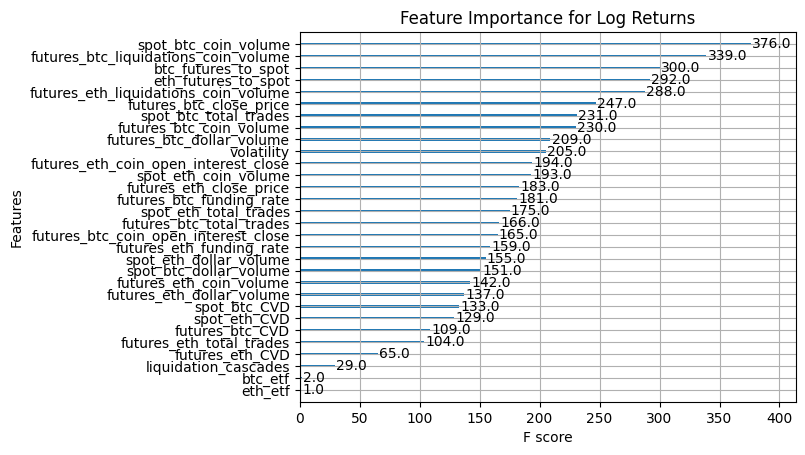

In [111]:
# For log_returns target

X = prediction_df.drop(columns=['log_returns'])  
y = prediction_df['log_returns'] 

model = XGBRegressor(n_estimators=100, random_state=42)
model.fit(X, y)

plt.figure(figsize=(18, 16))
plot_importance(model)
plt.title('Feature Importance for Log Returns')
plt.show()

### 3.1.3. Permutation Feature Importance

In [113]:
perm_importance = permutation_importance(model, X, y, n_repeats=10, random_state=42)
perm_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': perm_importance.importances_mean})
perm_importance_df = perm_importance_df.sort_values(by='Importance', ascending=False)

perm_importance_df

,Feature,Importance
27,btc_futures_to_spot,0.271289
4,futures_btc_close_price,0.233474
22,futures_eth_liquidations_coin_volume,0.211302
6,futures_btc_dollar_volume,0.191674
28,eth_futures_to_spot,0.180187
10,futures_btc_liquidations_coin_volume,0.137095
12,spot_eth_coin_volume,0.117724
18,futures_eth_dollar_volume,0.116423
16,futures_eth_close_price,0.111468
13,spot_eth_dollar_volume,0.108617


### 3.1.4. Mutual Information

In [128]:
mi = mutual_info_regression(X, y)

mi_importance = pd.DataFrame({'Feature': X.columns, 'Importance Log Returns': mi})
mi_importance = mi_importance.sort_values(by='Importance Log Returns', ascending=False)


print(mi_importance)

                                 Feature  Importance Log Returns
6              futures_btc_dollar_volume                0.285483
10  futures_btc_liquidations_coin_volume                0.285337
7               futures_btc_total_trades                0.255280
13                spot_eth_dollar_volume                0.226058
14                 spot_eth_total_trades                0.216307
12                  spot_eth_coin_volume                0.215852
5                futures_btc_coin_volume                0.206107
22  futures_eth_liquidations_coin_volume                0.190577
19              futures_eth_total_trades                0.171471
18             futures_eth_dollar_volume                0.167824
0                   spot_btc_coin_volume                0.166778
1                 spot_btc_dollar_volume                0.166540
2                  spot_btc_total_trades                0.149137
29                            volatility                0.139134
17               futures_

## 3.2. Feature Analysis for Futures BTC Price

### 3.2.1. Correlation Coefficient

In [101]:
cor_btc = prediction_df
correlation_matrix = cor_btc.corr()
target_correlation = correlation_matrix['futures_btc_close_price'].sort_values(ascending=False)

target_correlation_df = target_correlation.reset_index()
target_correlation_df.columns = ['Feature', 'Correlation with BTC Futures Price']
b
target_correlation_df

,Feature,Correlation with BTC Futures Price
0,futures_btc_close_price,1.000000
1,futures_eth_close_price,0.822552
2,btc_futures_to_spot,0.386361
3,futures_btc_funding_rate,0.320078
4,futures_eth_funding_rate,0.286436
5,eth_futures_to_spot,0.282220
6,liquidation_cascades,0.221141
7,spot_eth_dollar_volume,0.186435
8,spot_eth_total_trades,0.180385
9,futures_btc_dollar_volume,0.144424


### 3.2.2. XGBoost Feature Importance:

<Figure size 1800x1600 with 0 Axes>

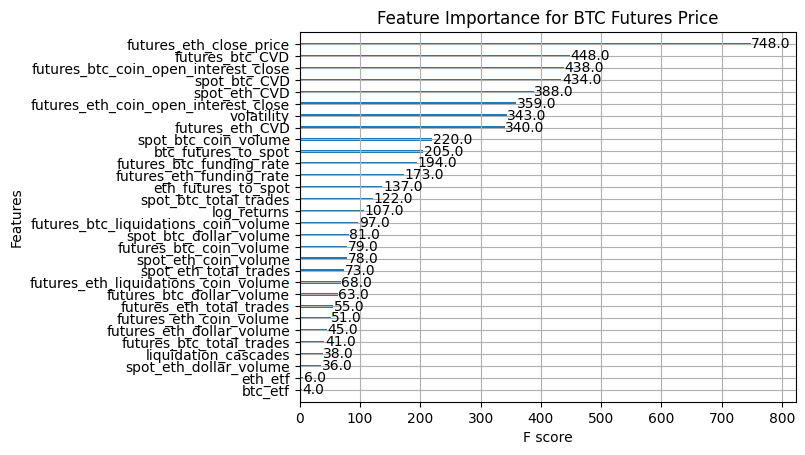

In [115]:
from xgboost import XGBRegressor
from xgboost import plot_importance
import matplotlib.pyplot as plt

# Define the input features and target variable
X = prediction_df.drop(columns=['futures_btc_close_price'])  
y = prediction_df['futures_btc_close_price']  # Target variable


model = XGBRegressor(n_estimators=100, random_state=42)
model.fit(X, y)


plt.figure(figsize=(18, 16))
plot_importance(model)
plt.title('Feature Importance for BTC Futures Price')
plt.show()

### 3.2.3. Permutation Feature Importance

In [116]:
perm_importance = permutation_importance(model, X, y, n_repeats=10, random_state=42)
perm_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': perm_importance.importances_mean})
perm_importance_df = perm_importance_df.sort_values(by='Importance', ascending=False)
perm_importance_df

,Feature,Importance
15,futures_eth_close_price,0.719054
22,futures_eth_CVD,0.226792
3,spot_btc_CVD,0.114155
7,futures_btc_coin_open_interest_close,0.092609
10,futures_btc_CVD,0.025362
14,spot_eth_CVD,0.013361
26,btc_futures_to_spot,0.006731
19,futures_eth_coin_open_interest_close,0.003811
27,eth_futures_to_spot,0.001574
8,futures_btc_funding_rate,0.000750


### 3.2.4. Mutual Information

In [124]:
mi = mutual_info_regression(X, y)

mi_importance = pd.DataFrame({'Feature': X.columns, 'Importance BTC Futures Price': mi})
mi_importance = mi_importance.sort_values(by='Importance BTC Futures Price', ascending=False)

print(mi_importance)

                                 Feature  Importance BTC Futures Price
3                           spot_btc_CVD                      3.118767
22                       futures_eth_CVD                      2.793937
10                       futures_btc_CVD                      2.665262
14                          spot_eth_CVD                      2.497796
15               futures_eth_close_price                      2.212861
7   futures_btc_coin_open_interest_close                      1.552230
19  futures_eth_coin_open_interest_close                      1.516246
29                            volatility                      0.805033
2                  spot_btc_total_trades                      0.463585
20              futures_eth_funding_rate                      0.450078
26                   btc_futures_to_spot                      0.442779
8               futures_btc_funding_rate                      0.435737
27                   eth_futures_to_spot                      0.411590
0     

### 3.3. Detailed Feature Analysis with Visuals for Futures BTC Close Price

In order to more easily observe the independent variables and the target variable on the same graph, it is necessary to scale all variables with the minmax scaler.

In [35]:
# Preserve the original time series
time_index = prediction_df.index

# Create the MinMaxScaler
scaler = MinMaxScaler()

# Apply MinMax scaling to prediction_df (excluding the index)
scaled_data = scaler.fit_transform(prediction_df)

# Store the scaled data as a DataFrame
minmax_df = pd.DataFrame(scaled_data, columns=prediction_df.columns, index=time_index)

# The time series has been re-added as the index
minmax_df.index.name = 'time'

### 3.3.1. Futures ETH Close Price

* Correlation: 0.822 - Strong positive correlation.
* XGBoost: The most important feature, with the highest predictive power.
* Permutation Importance: Highest impact on model performance.
* Mutual Information: High information gain.

##### futures_eth_close_price is the strongest predictor of futures_btc_close_price, consistently showing high importance across all metrics.

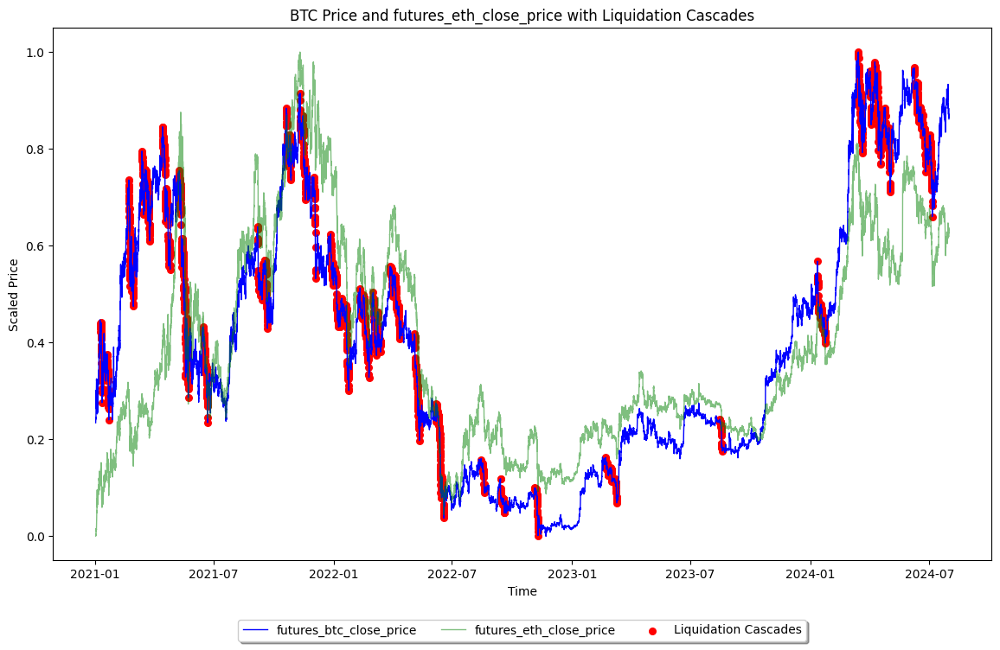

In [66]:
import matplotlib.pyplot as plt

# A figure is created with a specified size
plt.figure(figsize=(14, 8))

# The scaled BTC futures close price
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')

# The scaled ETH futures close price
plt.plot(minmax_df.index, minmax_df['futures_eth_close_price'], color='green', linewidth=1, alpha=0.5, label='futures_eth_close_price')

# Points where liquidation cascades occur are highlighted by scattering red dots on the BTC futures close price
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # The 's' value is increased for larger dots

# A title is added to the plot
plt.title('BTC Price and ETH Price with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')

# A legend is added below the plot, centered.
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

There is a strong correlation observed between the futures ETH and BTC prices; these two assets generally move in the same direction and with similar magnitude, indicating that common market dynamics are influencing both. Liquidation cascades coincide with significant drops in both ETH and BTC prices, highlighting that liquidations are a key factor increasing market volatility. This suggests that liquidations not only impact BTC but also affect ETH, demonstrating that the price movements of these two assets are closely interconnected.

### 3.3.2. Spot BTC CVD

* Correlation: 0.055 - Very weak positive correlation, almost negligible.
* XGBoost: High importance, significantly influences prediction accuracy.
* Permutation Importance: Low importance, minimal impact on the model.
* Mutual Information: Highest information gain, making it a critical feature.

##### Although spot_btc_CVD has a weak direct correlation with futures_btc_close_price, it holds significant importance in the model, particularly in terms of information gain, which suggests it may capture underlying patterns not immediately evident through correlation alone.

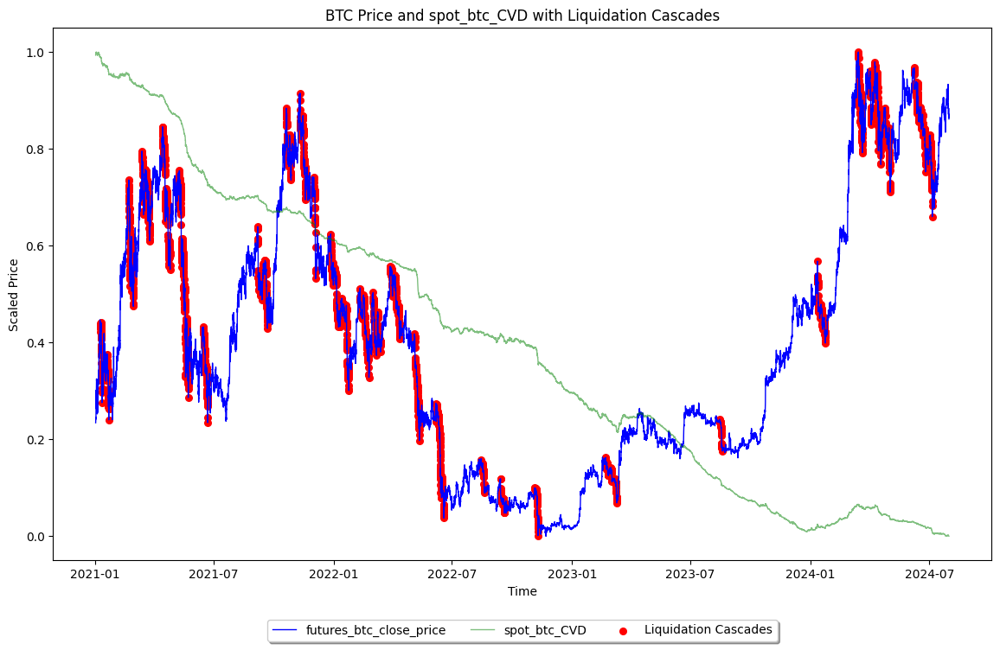

In [67]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['spot_btc_CVD'], color='green', linewidth=1, alpha=0.5, label='spot_btc_CVD')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and spot_btc_CVD with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The graph shows that spot_btc_CVD (green line) exhibits a general downward trend over time, indicating a decline in the cumulative volume balance in the spot BTC market and an increase in selling pressure. While there isn’t a direct correlation between futures_btc_close_price (blue line) and spot_btc_CVD, periods of decreasing spot_btc_CVD coincide with increased price fluctuations and a higher frequency of liquidation cascades (red dots). This suggests that declines in volume balance may lead to increased volatility in BTC prices, with liquidations further exacerbating this volatility. Overall, the drop in spot_btc_CVD appears to be associated with sharp declines in BTC prices and liquidations, implying that selling pressure in the market, combined with liquidations, puts additional pressure on prices.

### 3.3.3. Futures BTC CVD

* Correlation: -0.435 - Moderate negative correlation.
* XGBoost: High importance.
* Permutation Importance: Significant impact.
* Mutual Information: High information gain.

##### futures_btc_CVD is a crucial feature with consistent importance across all evaluation metrics, playing a significant role in predicting futures_btc_close_price.


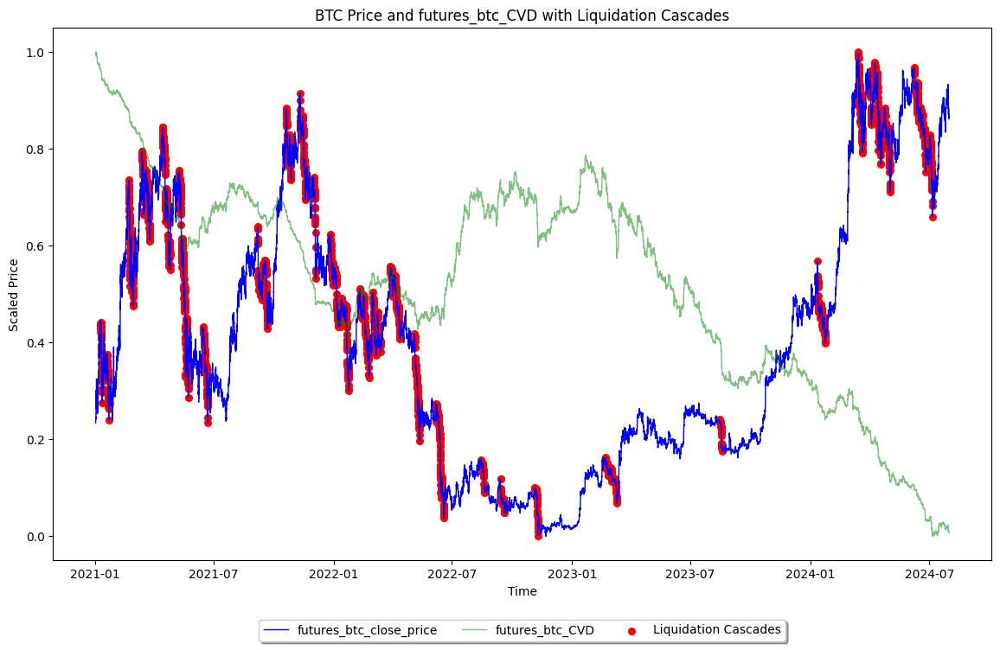

In [68]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_btc_CVD'], color='green', linewidth=1, alpha=0.5, label='futures_btc_CVD')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and futures_btc_CVD with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

In this graph, futures_btc_CVD (green line) generally shows a downward trend over time, indicating a decrease in cumulative volume balance in the BTC futures market and possibly an increase in selling pressure. The negative relationship between BTC closing price (futures_btc_close_price, blue line) and futures_btc_CVD is notable; as futures_btc_CVD decreases, there are more fluctuations in BTC prices and an increase in liquidation cascades (red dots). This suggests that a decrease in futures_btc_CVD contributes to greater volatility in BTC prices, with liquidation cascades further exacerbating this volatility. Overall, the combination of selling pressure and declining volume balance negatively impacts BTC prices, deepening price drops when combined with liquidations.

### 3.3.4. Futures BTC Coin Open Interest Close

* Correlation: -0.269 - Moderate negative correlation.
* XGBoost: Moderate importance, significant in the model.
* Permutation Importance: Low importance, slight effect.
* Mutual Information: Moderate information gain.

##### futures_eth_coin_open_interest_close plays a moderate role in predicting futures_btc_close_price, with consistent but not overwhelming importance across evaluation metrics.

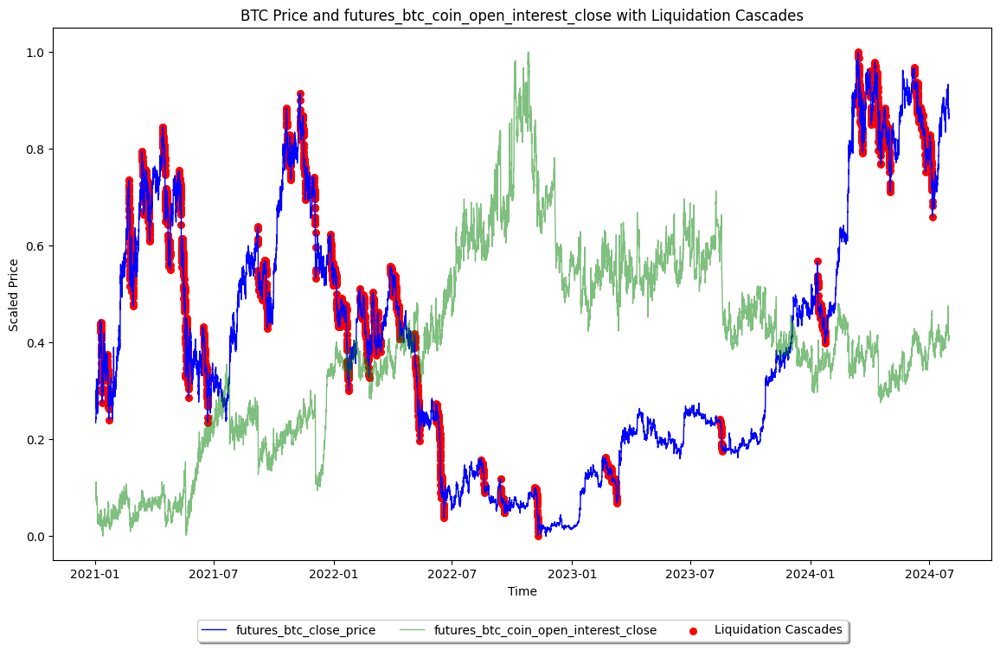

In [69]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_btc_coin_open_interest_close'], color='green', linewidth=1, alpha=0.5, label='futures_btc_coin_open_interest_close')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and futures_btc_coin_open_interest_close with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

This graph shows the relationship between futures_btc_close_price (blue line) and futures_btc_coin_open_interest_close (green line), along with liquidation cascades (red dots). The graph reveals a generally inverse relationship between the BTC closing price and the open interest close; as futures_btc_coin_open_interest_close rises, BTC prices often decline, and vice versa. Notably, periods of increased open interest often coincide with higher market volatility and liquidation events, suggesting that as the open interest grows, the market becomes more susceptible to sharp price movements and liquidations. This dynamic indicates that open interest plays a critical role in the overall market behavior, particularly in driving or exacerbating price declines during periods of market stress.

### 3.3.5. Spot ETH CVD

* Correlation: -0.098 - Weak negative correlation.
* XGBoost: Low to moderate importance.
* Permutation Importance: Minimal impact.
* Mutual Information: Moderate information gain.

##### spot_eth_CVD shows a weak correlation but contributes moderate information, suggesting a hidden importance in the model.


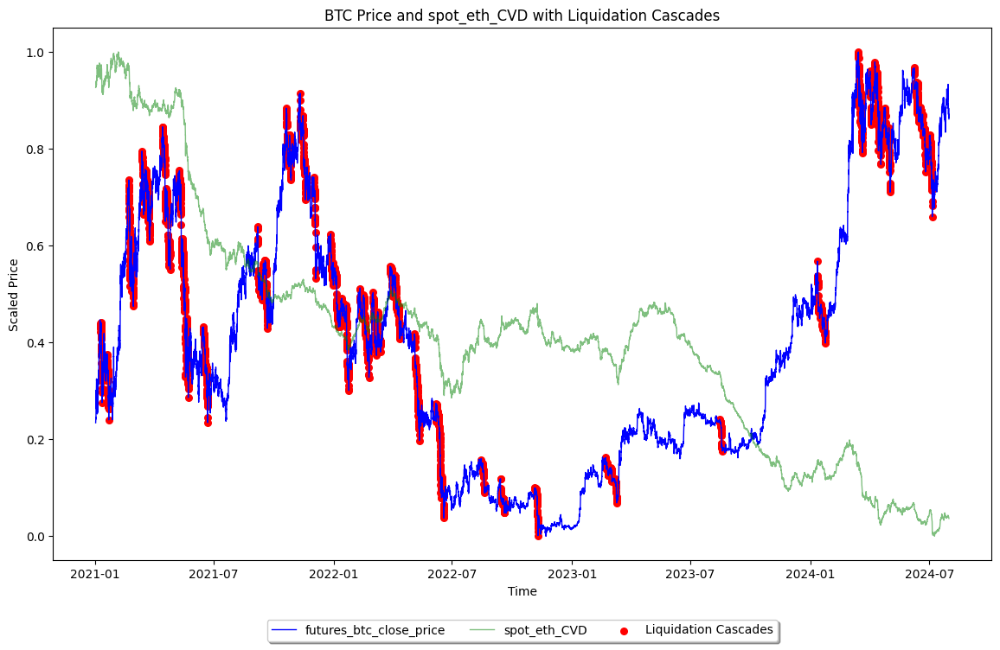

In [70]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['spot_eth_CVD'], color='green', linewidth=1, alpha=0.5, label='spot_eth_CVD')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and spot_eth_CVD with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The graph indicates a generally inverse relationship between Spot ETH CVD and BTC closing price; as spot_eth_CVD decreases, BTC prices tend to experience more volatility and sharp drops, often coinciding with liquidation events. This suggests that as the cumulative volume delta for ETH decreases, it may signal increased selling pressure or reduced buying strength, which in turn negatively impacts BTC prices, especially during periods of market stress reflected in the liquidation cascades.

### 3.3.6. Futures ETH Coin Open Interest Close

* Correlation: There is a negative correlation (-0.397646).

* XGBoost: It has been identified as the fifth most important feature (F score: 403.0).

* Permutation Feature Importance: It carries moderate importance (0.007885).

* Mutual Information: It ranks seventh (1.514458).

* Lasso Regression: Despite having a small positive coefficient (1.669578e-02), it remains an important feature in the model.

##### Futures ETH Coin Open Interest Close has an inverse relationship with futures_btc_close_price. However, it plays a significant role in improving model performance.

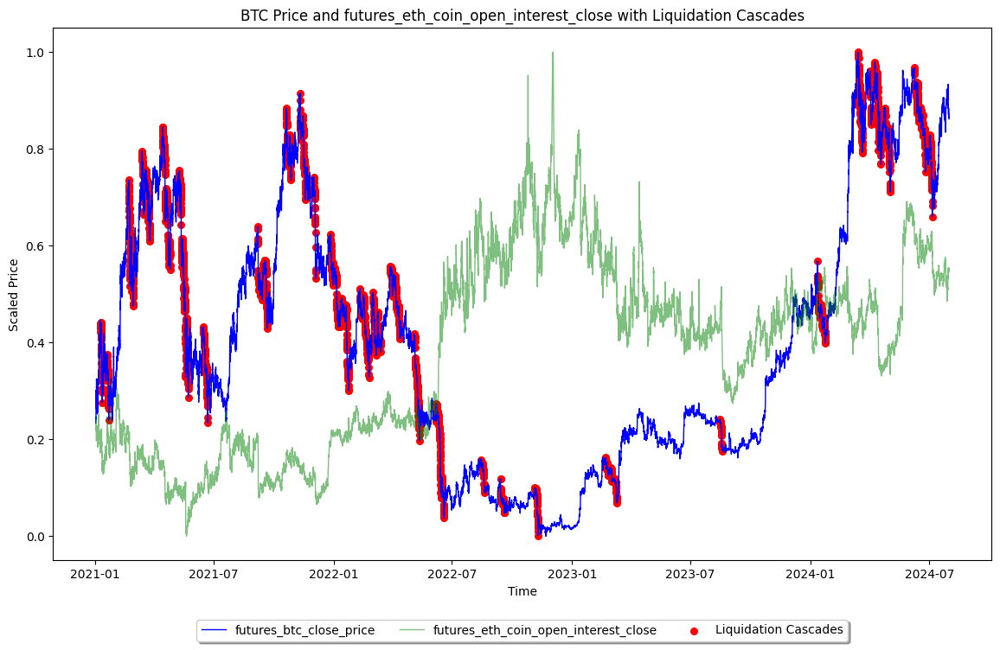

In [71]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_eth_coin_open_interest_close'], color='green', linewidth=1, alpha=0.5, label='futures_eth_coin_open_interest_close')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and futures_eth_coin_open_interest_close with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The data suggests an inverse relationship between BTC prices and ETH open interest; as the futures_eth_coin_open_interest_close rises, BTC prices tend to decline. Additionally, periods of high ETH open interest often coincide with increased market volatility and liquidation events, indicating that as open interest grows, the market may become more susceptible to price drops and liquidations, especially during stressed market conditions.

### 3.3.7. Spot BTC Dollar Volume

* Correlation: There is a negative correlation (-0.140156).

* XGBoost: It has a lower importance score (F score: 146.0).

* Permutation Feature Importance: It has low importance (0.000120).

* Mutual Information: It ranks second (0.294437).


##### Spot BTC Dollar Volume has a weak negative relationship with futures_btc_close_price and overall contributes little to the model’s performance.


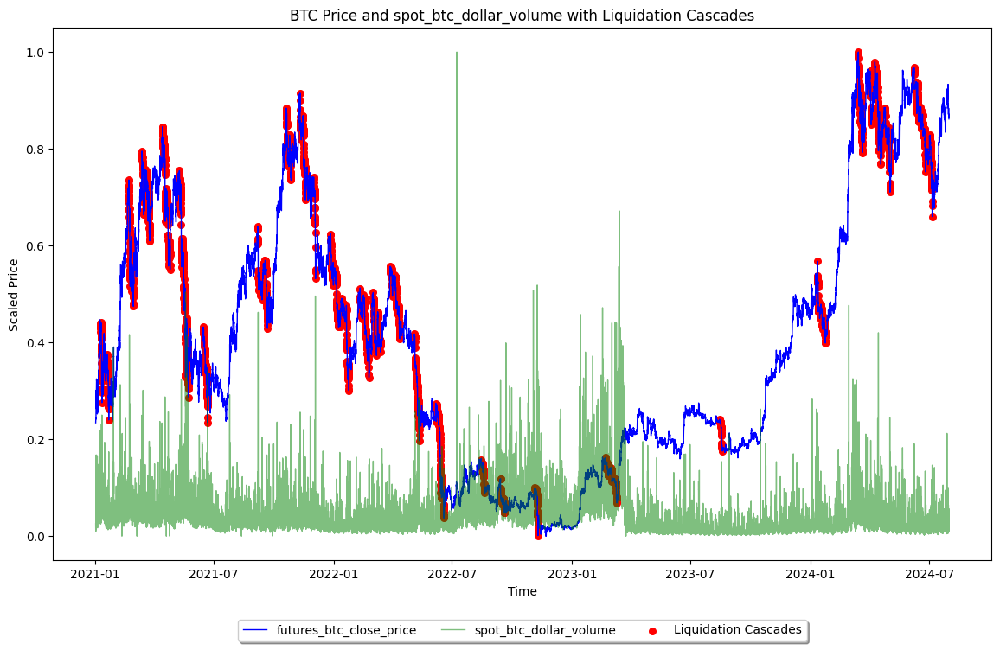

In [72]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['spot_btc_dollar_volume'], color='green', linewidth=1, alpha=0.5, label='spot_btc_dollar_volume')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and spot_btc_dollar_volume with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green bars representing Spot BTC Dollar Volume show significant fluctuations, often aligning with periods of high volatility in BTC prices. Notably, spikes in dollar volume frequently precede or coincide with liquidation events, indicating that increased trading activity may contribute to market stress and subsequent price drops. 

### 3.3.8. Futures BTC Dollar Volume

* Correlation: 0.145 - Weak positive correlation.
* XGBoost: Low importance.
* Permutation Importance: Minimal impact.
* Mutual Information: Low information gain.

##### futures_btc_dollar_volume is a low-importance feature across all metrics, indicating a minimal role in predicting the target variable.

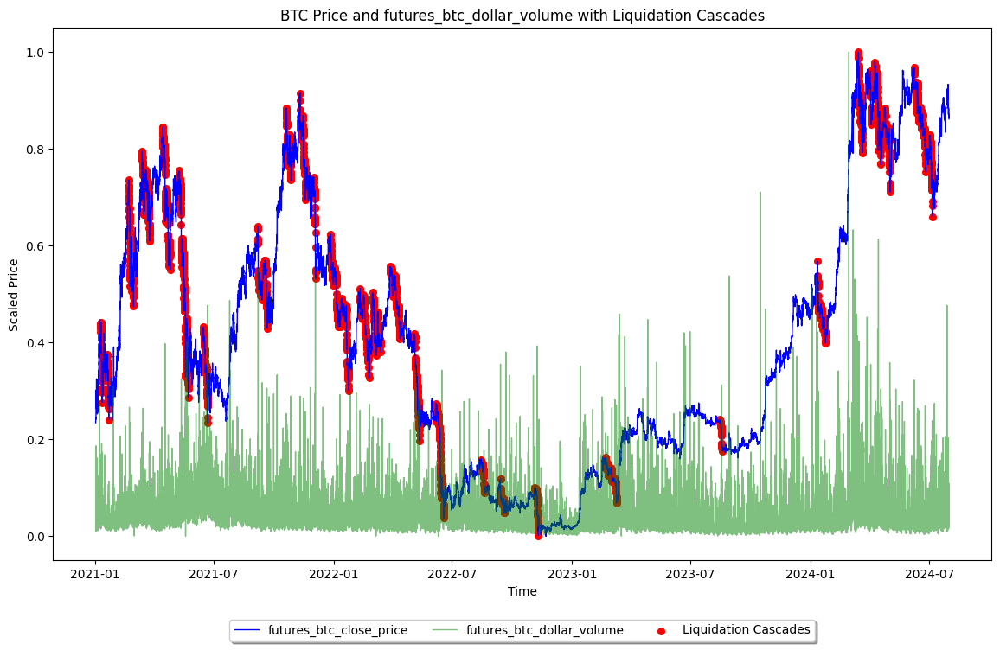

In [73]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_btc_dollar_volume'], color='green', linewidth=1, alpha=0.5, label='futures_btc_dollar_volume')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and futures_btc_dollar_volume with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The graph illustrates the relationship between the scaled futures BTC close price (in blue) and the futures BTC dollar volume (in green) over time, with specific attention to the occurrence of liquidation cascades (marked by red dots). The blue line representing the BTC close price shows significant fluctuations, capturing the inherent volatility in the cryptocurrency market. The green bars, indicating dollar volume, fluctuate in response to market conditions, with notable spikes corresponding to periods of high trading activity. The red dots highlight points of liquidation cascades, which seem to coincide with sharp declines or significant movements in the BTC close price. This suggests that liquidation cascades are likely triggered during periods of increased volatility and substantial trading volume, emphasizing the close relationship between price movements, trading volume, and the occurrence of liquidations in the market.

### 3.3.10. Spot ETH Dollar Volume

* Correlation: 0.187 - Weak positive correlation.
* XGBoost: Low importance.
* Permutation Importance: Very low importance.
* Mutual Information: Low information gain.

##### spot_eth_dollar_volume has a weak correlation and provides little value to the model, indicating its low importance across all evaluation metrics.

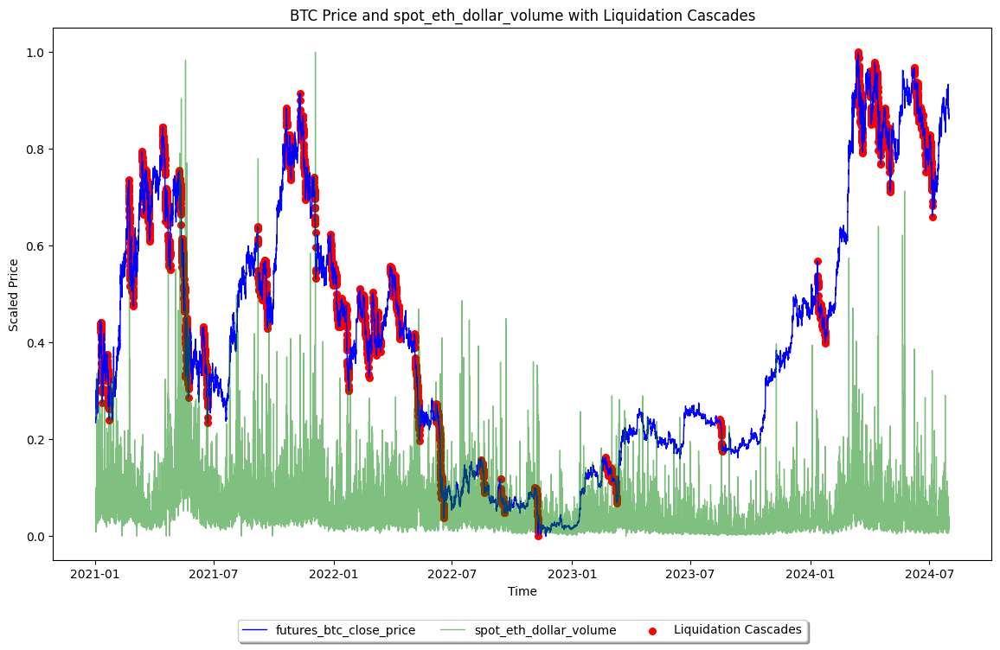

In [75]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['spot_eth_dollar_volume'], color='green', linewidth=1, alpha=0.5, label='spot_eth_dollar_volume')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and spot_eth_dollar_volume with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green bars representing Spot ETH Dollar Volume exhibit significant fluctuations, yet their influence on BTC price appears minimal. Although there are instances where spikes in dollar volume align with BTC price changes, the overall impact on the BTC price trend is weak. This suggests that while there is some interaction between ETH trading volume and BTC price movements, it is not a dominant factor, and its contribution to major price shifts is limited, as indicated by the low positive correlation.

### 3.3.11. Spot ETH Total Trades

* Correlation: 0.181 - Weak positive correlation.
* XGBoost: Low importance.
* Permutation Importance: Very low importance.
* Mutual Information: Low information gain.

##### spot_eth_total_trades has minimal impact on the model, contributing weakly across all evaluation methods.


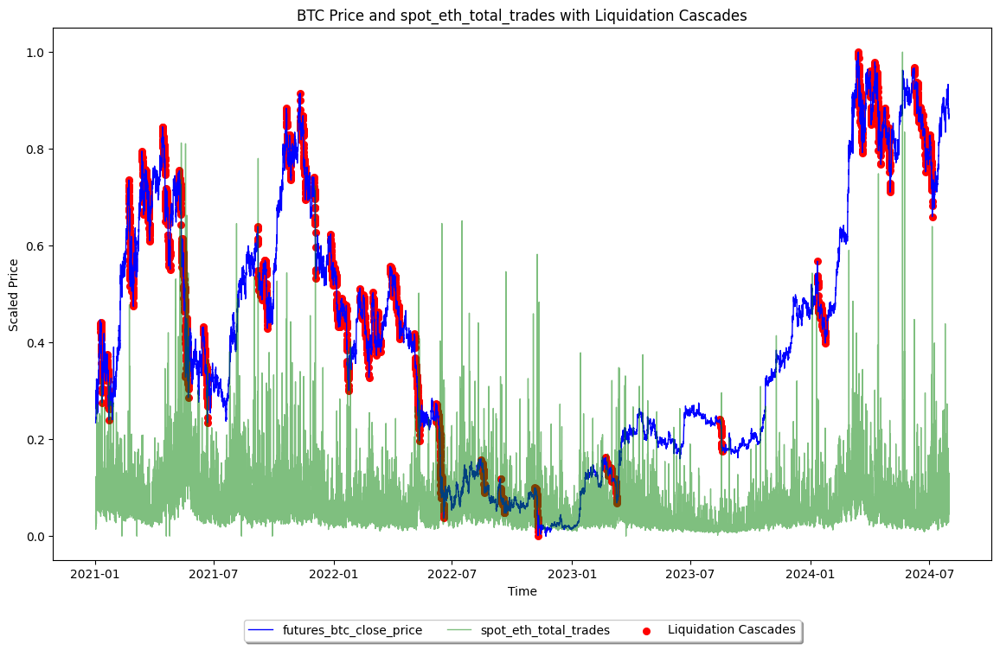

In [76]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['spot_eth_total_trades'], color='green', linewidth=1, alpha=0.5, label='spot_eth_total_trades')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and spot_eth_total_trades with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green bars representing total ETH transactions frequently exhibit fluctuations, especially during periods of high BTC price volatility. While there are instances where increases in ETH trading volume coincide with BTC price movements, the overall impact on BTC’s price appears to be minimal. The weak positive correlation indicates that there is a connection between ETH trading activity and BTC price changes, but it suggests that ETH trading activity is not a significant determinant of BTC price fluctuations.

### 3.3.12. Futures ETH Total Trades

* Correlation: -0.022 - Negligible negative correlation.
* XGBoost: Low importance.
* Permutation Importance: Almost no impact.
* Mutual Information: Low information gain.

##### futures_eth_total_trades has negligible importance and little to no influence on the model’s performance.

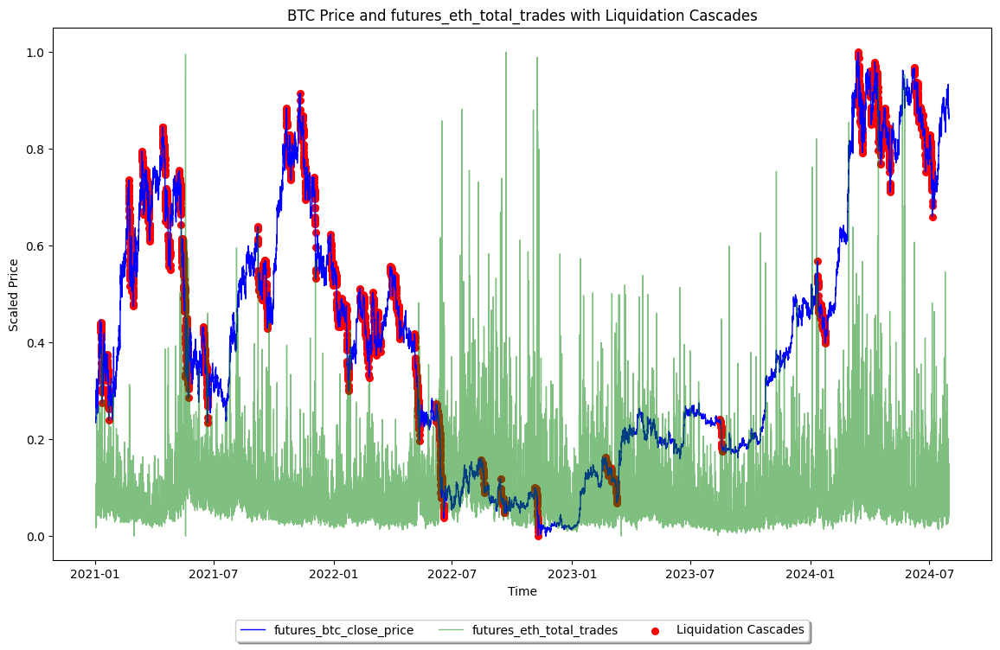

In [77]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_eth_total_trades'], color='green', linewidth=1, alpha=0.5, label='futures_eth_total_trades')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and futures_eth_total_trades with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green bars indicate frequent fluctuations in the total number of ETH trades, especially during periods of high BTC price volatility. Despite these fluctuations, the overall impact of ETH total trades on BTC price appears minimal, as indicated by the weak negative correlation. The presence of liquidation cascades seems to align with periods of increased trading activity, but the overall influence of ETH total trades on BTC price movements remains limited.


### 3.3.13. Spot ETH Coin Volume

* Correlation: -0.085 - Weak negative correlation.
* XGBoost: Very low importance.
* Permutation Importance: Minimal impact.
* Mutual Information: Low information gain.

##### spot_eth_coin_volume holds minimal importance in the model, with a weak correlation and low influence on predictions.

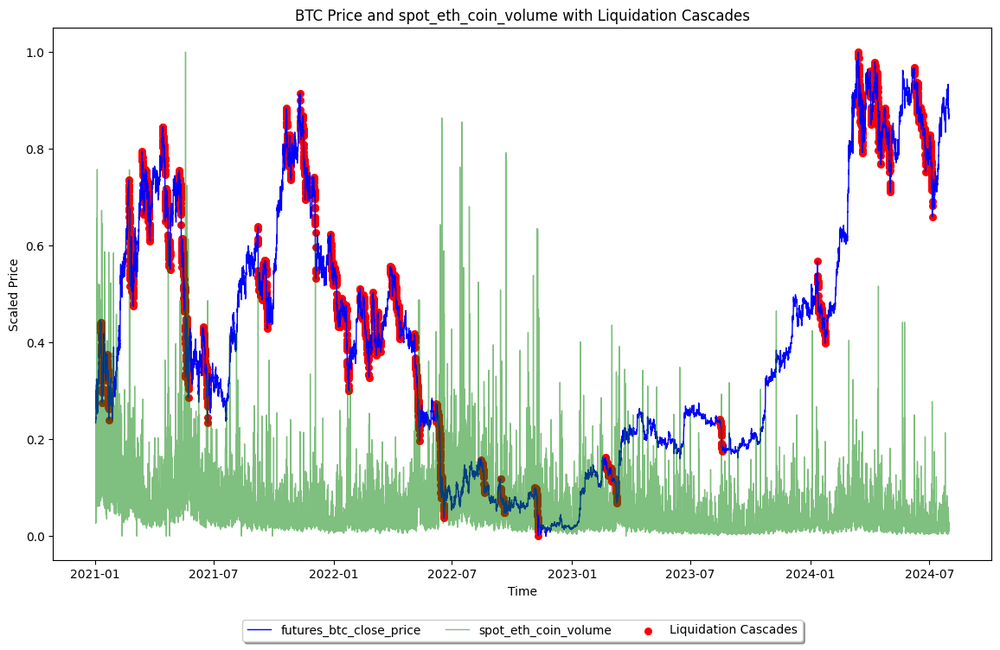

In [78]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['spot_eth_coin_volume'], color='green', linewidth=1, alpha=0.5, label='spot_eth_coin_volume')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and spot_eth_coin_volume with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green bars representing Spot ETH Coin Volume show consistent fluctuations, especially during periods of increased BTC price volatility. Despite these fluctuations, the overall impact of ETH coin volume on BTC price appears to be minimal, as indicated by the weak negative correlation. The alignment of liquidation cascades with spikes in ETH coin volume suggests some connection between increased trading activity and market stress, but the overall contribution of ETH coin volume to BTC price movements remains limited.

### 14. Spot ETH CVD

* Correlation: There is a weak negative correlation (-0.223791).
* XGBoost: The feature is moderately important.
* Permutation Feature Importance: It shows very low significance.
* Mutual Information: It ranks low in importance.

##### Futures BTC Coin Volume has a weak negative relationship with futures_btc_close_price and provides a minimal contribution to the model overall.

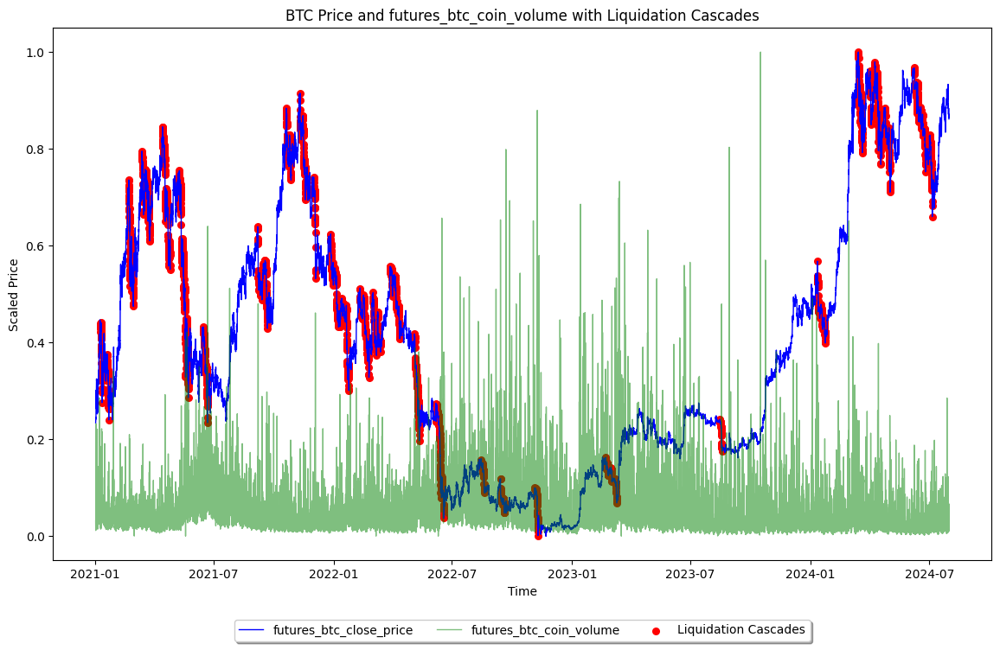

In [80]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_btc_coin_volume'], color='green', linewidth=1, alpha=0.5, label='futures_btc_coin_volume')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and futures_btc_coin_volume with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The graph shows the relationship between the scaled futures BTC close price (blue line) and the futures BTC coin volume (green bars), with liquidation cascades marked by red dots. The BTC price fluctuates significantly, reflecting market volatility. The green volume bars spike during periods of high activity, often coinciding with sharp price movements. Liquidation cascades typically occur during extreme price changes, indicating a strong link between high volatility, trading volume, and these events.

### 3.3.16. Futures ETH Coin Volume

* Correlation: There is a weak negative correlation (-0.269033).
* XGBoost: The feature is considered to have lower importance.
* Permutation Feature Importance: It shows very minimal significance.
* Mutual Information: The feature is ranked relatively low in importance.

##### Futures ETH Coin Volume has a weak negative relationship with futures_btc_close_price and offers a minimal contribution to the model overall.

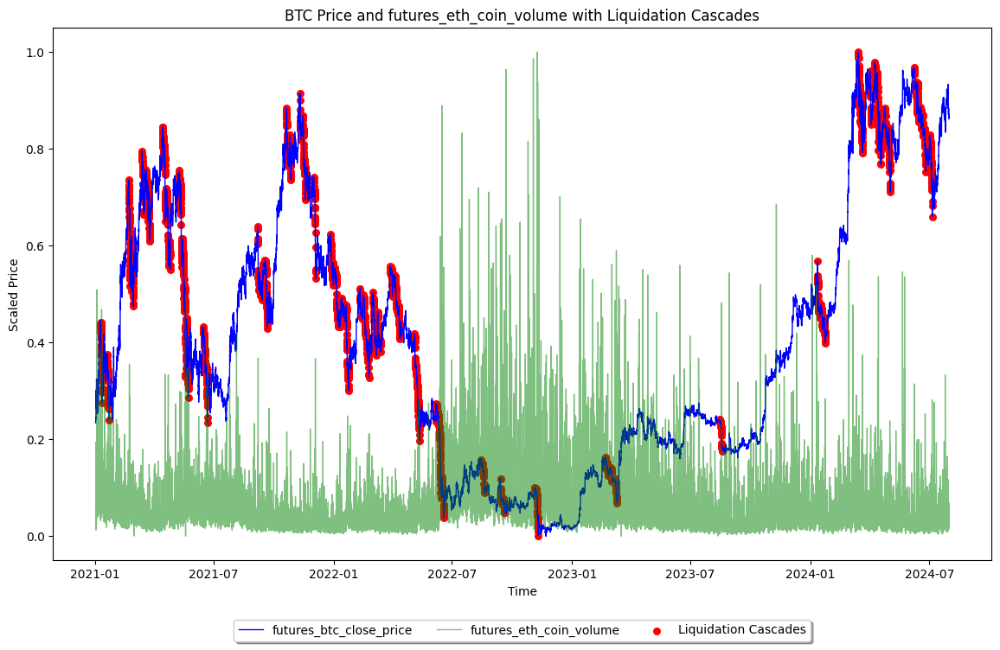

In [81]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_eth_coin_volume'], color='green', linewidth=1, alpha=0.5, label='futures_eth_coin_volume')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and futures_eth_coin_volume with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The graph shows the scaled BTC futures price (blue) and ETH coin volume (green) alongside liquidation cascades (red dots). The BTC price fluctuates significantly, indicating market volatility. Peaks in ETH volume often align with sharp BTC price movements. Liquidation cascades typically occur during or after these significant price changes, highlighting the link between volatility, ETH volume, and liquidation events.

### 3.3.17. Spot BTC Total Trades

* Correlation: 0.181 - Weak positive correlation.
* XGBoost: Moderate importance, some contribution to the model.
* Permutation Importance: Very low importance.
* Mutual Information: Low information gain.

###### spot_btc_total_trades has weak predictive power, with moderate importance in XGBoost but minimal impact in other evaluations.

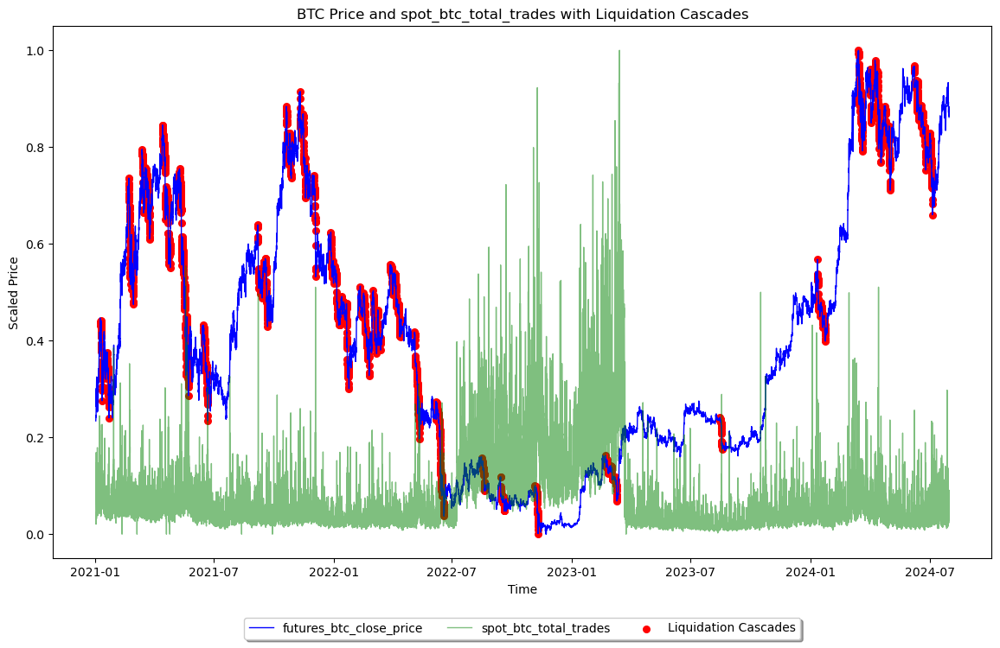

In [36]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['spot_btc_total_trades'], color='green', linewidth=1, alpha=0.5, label='spot_btc_total_trades')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and spot_btc_total_trades with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green bars, representing Spot BTC Total Trades, show noticeable fluctuations, particularly during periods of significant BTC price movements. The moderate negative correlation suggests that an increase in total BTC trades is often associated with a decrease in BTC price. The alignment of liquidation cascades with peaks in total trades highlights periods of intense market activity, indicating that total trades play a role during times of market stress, although their overall contribution to the model is relatively low.

### 3.3.18 Spot BTC Coin Volume

* Correlation: -0.414 - Moderate negative correlation.
* XGBoost: Moderate importance in prediction accuracy.
* Permutation Importance: Low importance, minor impact on model performance.
* Mutual Information: Moderate information gain.

##### While spot_btc_coin_volume has a moderate negative correlation, its overall importance in the model is somewhat limited, although it still contributes meaningful information.


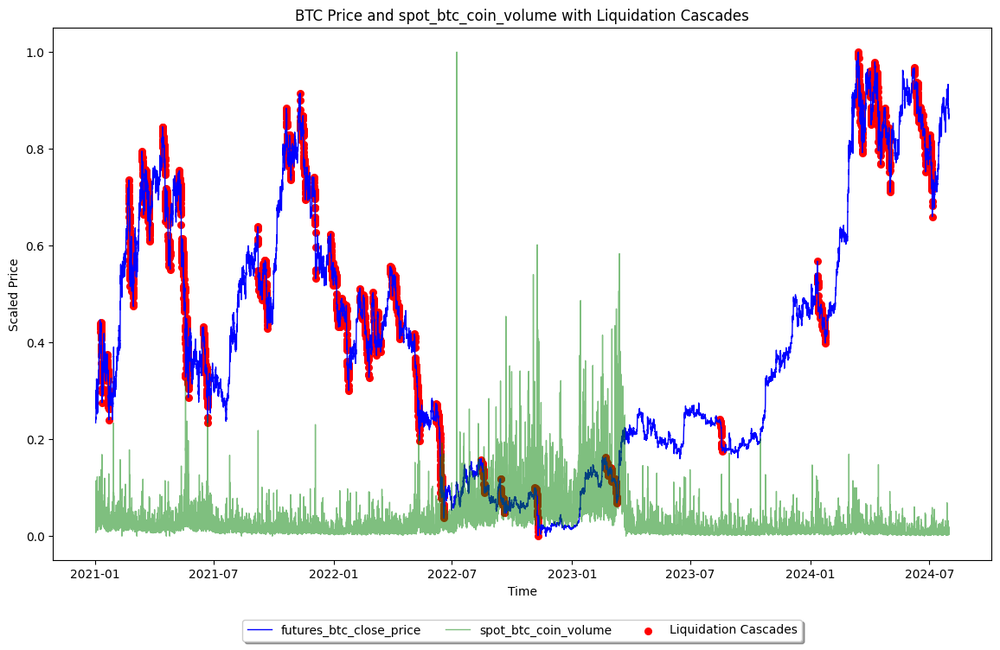

In [83]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['spot_btc_coin_volume'], color='green', linewidth=1, alpha=0.5, label='spot_btc_coin_volume')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and spot_btc_coin_volume with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

Fluctuations in spot BTC coin volume seem to have a noticeable impact on the futures BTC closing price. Volume spikes are particularly evident during price declines. The liquidation cascades (red dots) coincide with sharp price drops, further highlighting the interaction between volume and price movements.

### 3.3.19. Futures ETH CVD

* Correlation: 0.285 - Moderate positive correlation.
* XGBoost: High importance, strongly contributes to predictions.
* Permutation Importance: Moderate importance, showing some effect on performance.
* Mutual Information: Second-highest information gain.

##### futures_eth_CVD is moderately correlated with the target and has high importance in the model, indicating it is a valuable predictor despite not having the strongest direct correlation.

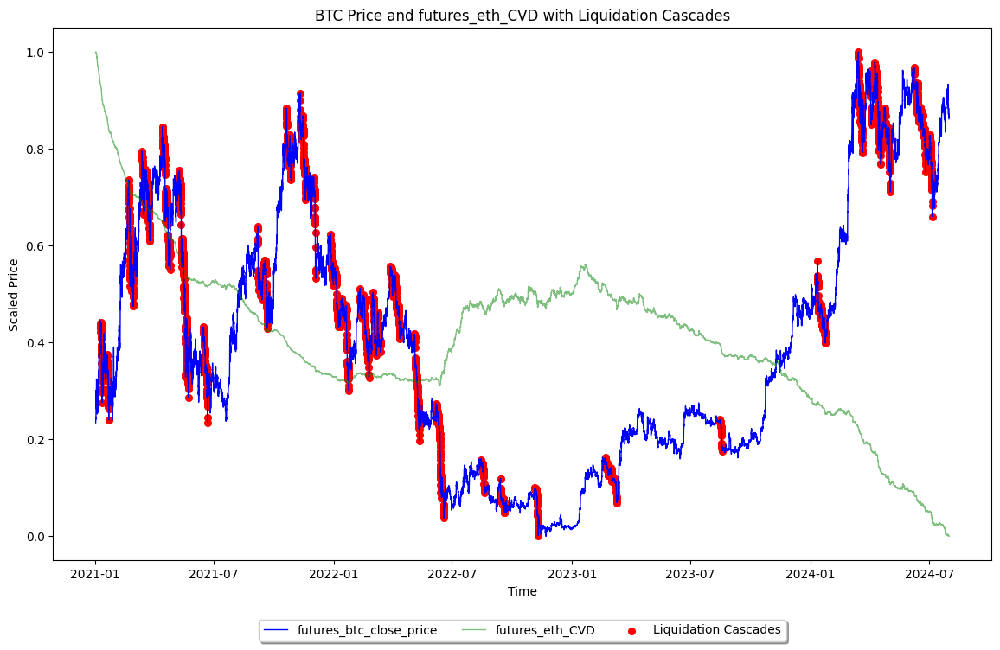

In [84]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_eth_CVD'], color='green', linewidth=1, alpha=0.5, label='futures_eth_CVD')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and futures_eth_CVD with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The ETH CVD exhibits a downward trend, suggesting a decreasing cumulative volume delta for ETH over this period. As ETH CVD decreases, there are multiple instances where BTC prices also show a decline, particularly around liquidation events, which are prominently marked in red. This indicates that the drop in ETH CVD might be correlated with BTC price movements, especially during periods of high market stress.


### 3.3.20. Futures BTC CVD

* Correlation: Shows a moderate negative correlation with futures_btc_close_price (-0.435057)
* XGBoost: This feature is highly significant, being one of the top contributors to the model.
* Permutation Feature Importance: The feature has medium importance, moderately influencing the model’s performance.
* Mutual Information: It ranks as a key feature, sharing a significant amount of information with the target variable.


##### Futures BTC CVD has a moderate negative correlation with the BTC futures closing price and plays an important role in the model’s performance, particularly as indicated by XGBoost and Mutual Information.

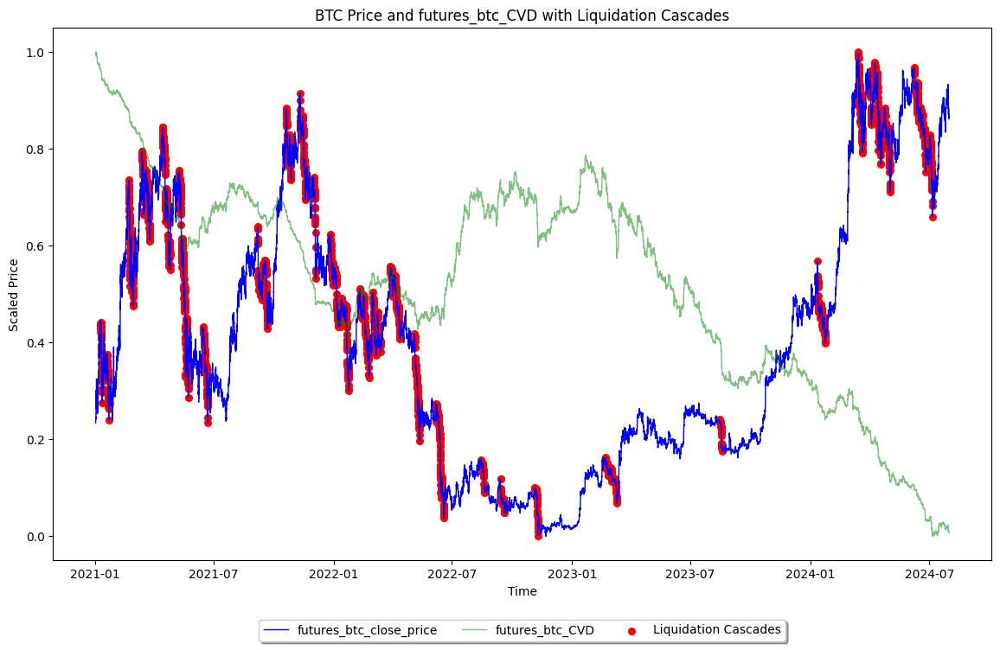

In [85]:
import matplotlib.pyplot as plt


plt.figure(figsize=(14, 8))


plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')


plt.plot(minmax_df.index, minmax_df['futures_btc_CVD'], color='green', linewidth=1, alpha=0.5, label='futures_btc_CVD')

plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and futures_btc_CVD with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')


plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)


plt.show()

There is a noticeable inverse relationship between the BTC CVD and the BTC futures close price, especially evident from mid-2022 onward. As BTC CVD decreases, the BTC futures price generally increases, highlighting the significant negative correlation observed in the analysis. Liquidation cascades, marked by red dots, occur during both price increases and decreases, often aligning with sharp price movements.


### 3.3.21. Futures BTC Coin Open Interest Close

* Correlation: There is a strong negative correlation (-0.619851), indicating an inverse relationship with the closing price.
* XGBoost: This feature is among the top contributors, ranked fourth in importance.
* Permutation Feature Importance: It has moderate significance in influencing the model.
* Mutual Information: The feature is relatively important, ranked sixth in terms of shared information with the target variable.


##### Futures BTC Coin Open Interest Close has an inverse relationship with futures_btc_close_price and plays a significant role in improving the model’s accuracy.


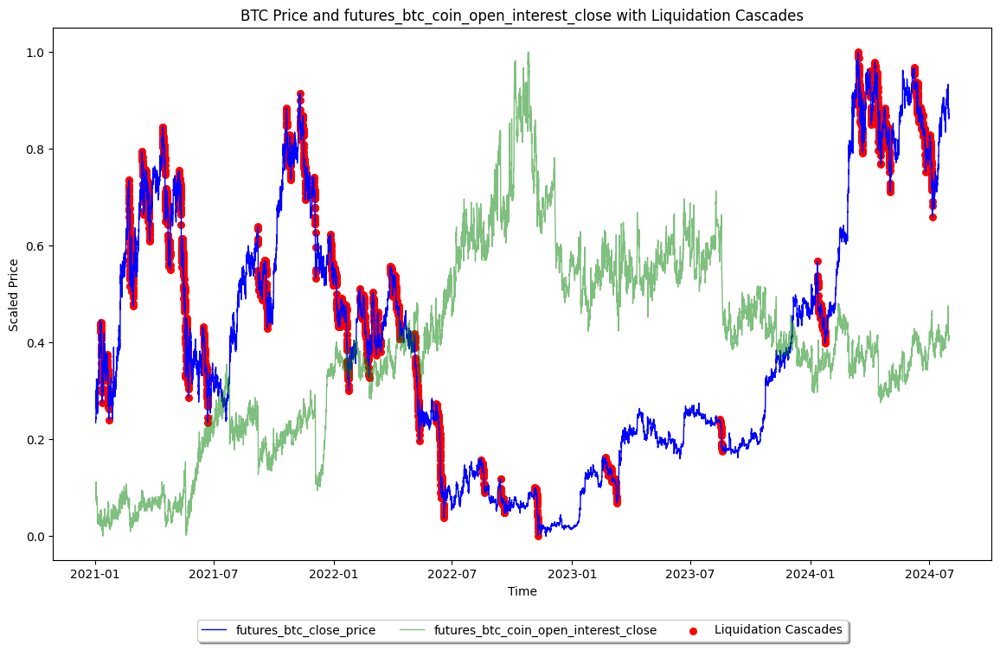

In [86]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_btc_coin_open_interest_close'], color='green', linewidth=1, alpha=0.5, label='futures_btc_coin_open_interest_close')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and futures_btc_coin_open_interest_close with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The BTC Coin Open Interest Close generally exhibits an inverse relationship with the BTC closing price, indicating that increasing open interest close is typically associated with price declines.

### 3.3.22. Futures BTC Liquidations Coin Volume

* Correlation: There is a very weak positive correlation (0.036883) with the target variable.
* XGBoost: It has a low level of importance in the model.
* Permutation Feature Importance: It is assigned a very low importance score, indicating a minimal impact on the model’s performance.
* Mutual Information: This feature ranks low in terms of information shared with the target variable.

##### Futures BTC Liquidations Coin Volume shows a very weak relationship with the target variable and contributes minimally to the model’s performance, as reflected across all evaluation methods.

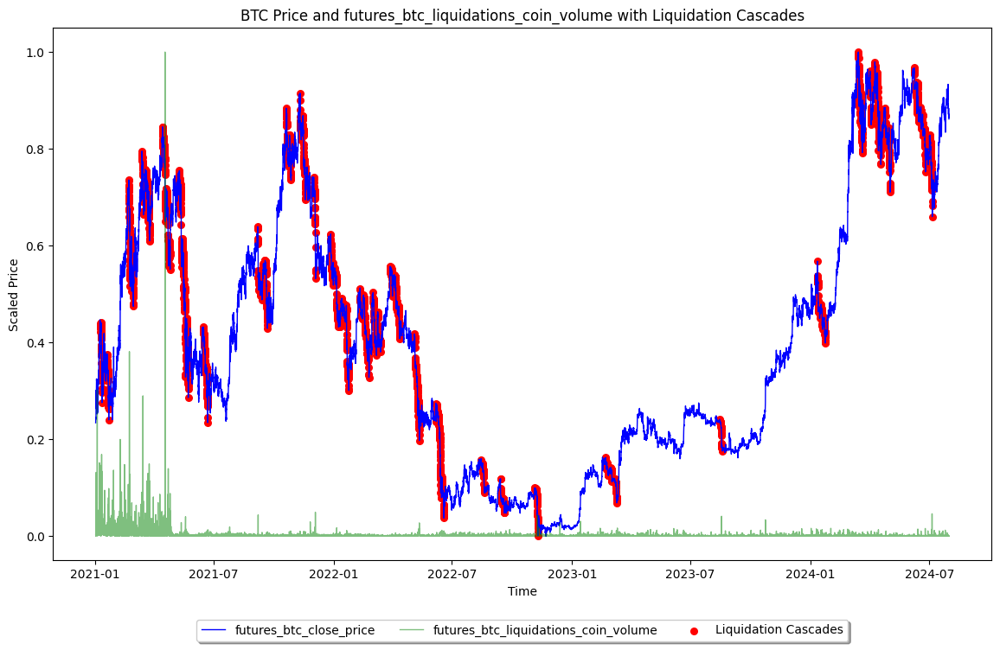

In [87]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_btc_liquidations_coin_volume'], color='green', linewidth=1, alpha=0.5, label='futures_btc_liquidations_coin_volume')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and futures_btc_liquidations_coin_volume with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

This graph illustrates the relationship between futures_btc_close_price (blue line), futures_btc_liquidations_coin_volume (green line), and liquidation_cascades (red dots). The green line, representing futures_btc_liquidations_coin_volume, typically spikes during significant drops in the futures_btc_close_price, indicating periods of high liquidation activity. During these times, the red dots, which represent liquidation_cascades, are densely clustered in areas where the futures_btc_close_price is rapidly declining. Conversely, during periods where the futures_btc_liquidations_coin_volume remains relatively flat, the price fluctuations are less pronounced, and fewer liquidation_cascades are observed. This suggests that in times of lower liquidation activity, price movements tend to be more stable.

### 3.3.23. BTC ETF

* Correlation: 0.005 - Negligible correlation.
* XGBoost: Lowest importance, nearly irrelevant.
* Permutation Importance: No impact on the model.
* Mutual Information: No information gain.

##### btc_etf is the least important variable across all metrics, providing minimal predictive value and having virtually no impact on the model’s performance.

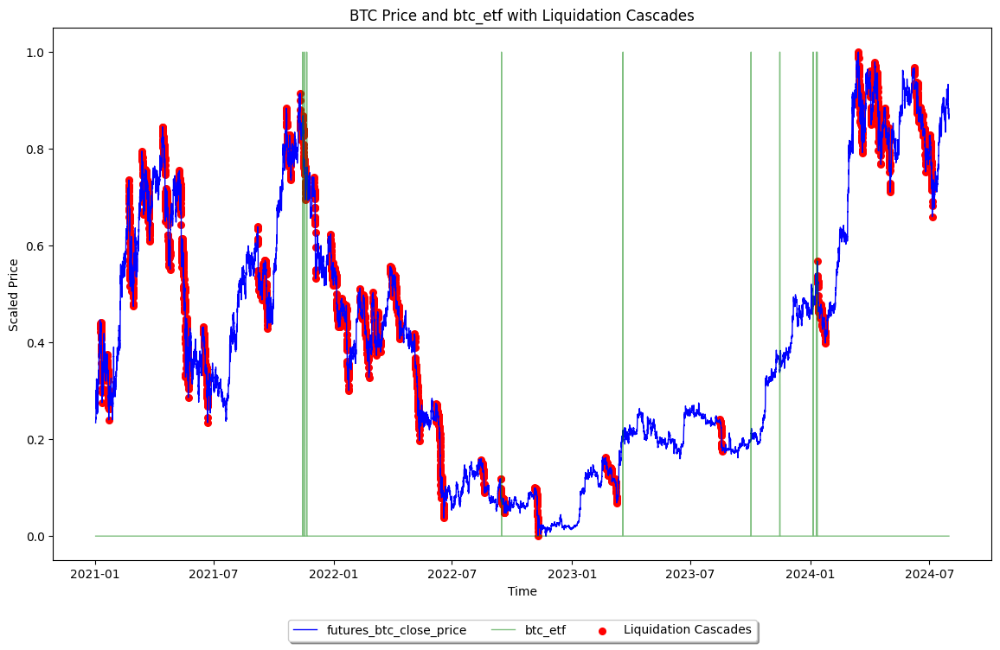

In [88]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['btc_etf'], color='green', linewidth=1, alpha=0.5, label='btc_etf')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and btc_etf with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green line representing the BTC ETF shows very minimal movement, indicating that its impact on the futures BTC closing price is negligible. There is no significant correlation between the BTC ETF and the futures BTC closing price, as both seem to move independently of each other. The red dots, indicating liquidation cascades, appear mainly during sharp declines in the blue line (futures BTC closing price), but there is no clear interaction between these events and the BTC ETF. This suggests that the BTC ETF does not play a significant role in influencing liquidation events or the overall price movement of BTC futures.


### 24. ETH ETF

* Correlation: 0.007 - Negligible positive correlation.
* XGBoost: Very low importance.
* Permutation Importance: Almost no impact.
* Mutual Information: Minimal information gain.

##### eth_etf is largely irrelevant in predicting futures_btc_close_price, with negligible importance across all evaluation methods.

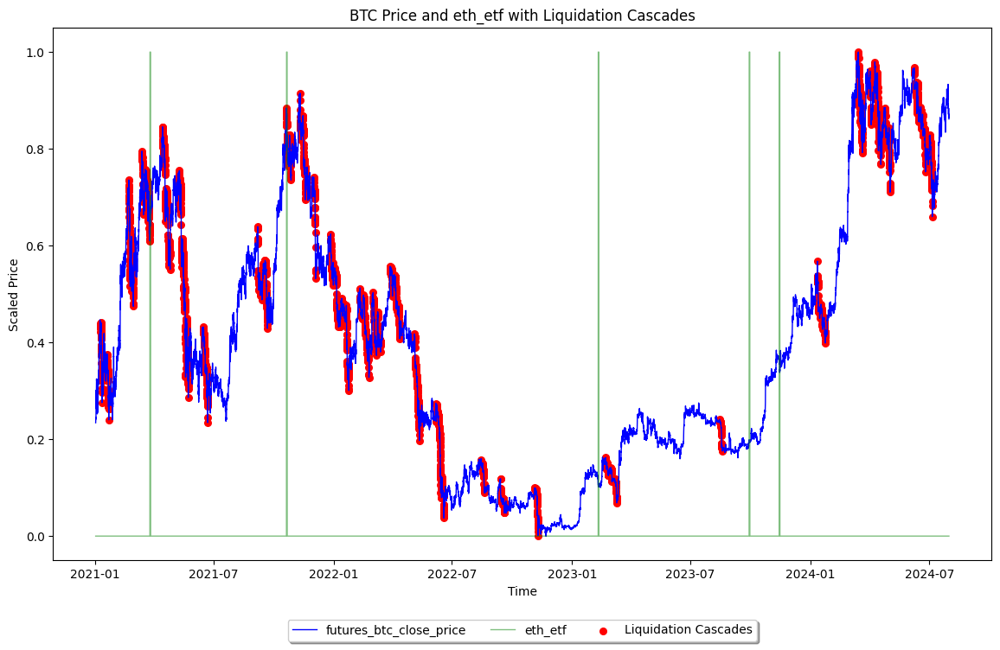

In [89]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['eth_etf'], color='green', linewidth=1, alpha=0.5, label='eth_etf')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and eth_etf with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green line representing the ETH ETF exhibits minimal movement and does not show a clear correlation with the blue line, which represents the futures BTC closing price. The ETH ETF seems to have little to no impact on the futures BTC price. The red dots, indicating liquidation cascades, are predominantly observed during periods of sharp declines in the blue line, but these events do not appear to be influenced by the ETH ETF. Overall, the ETH ETF does not significantly affect the BTC futures market or trigger liquidation cascades.


### 3.3.25. Liquidation Cascades

* Correlation: 0.221 - Weak positive correlation.
* XGBoost: Very low importance.
* Permutation Importance: Minimal impact.
* Mutual Information: Low information gain.

##### liquidation_cascades provides some predictive value due to its weak positive correlation, but its overall importance is minimal across most metrics.

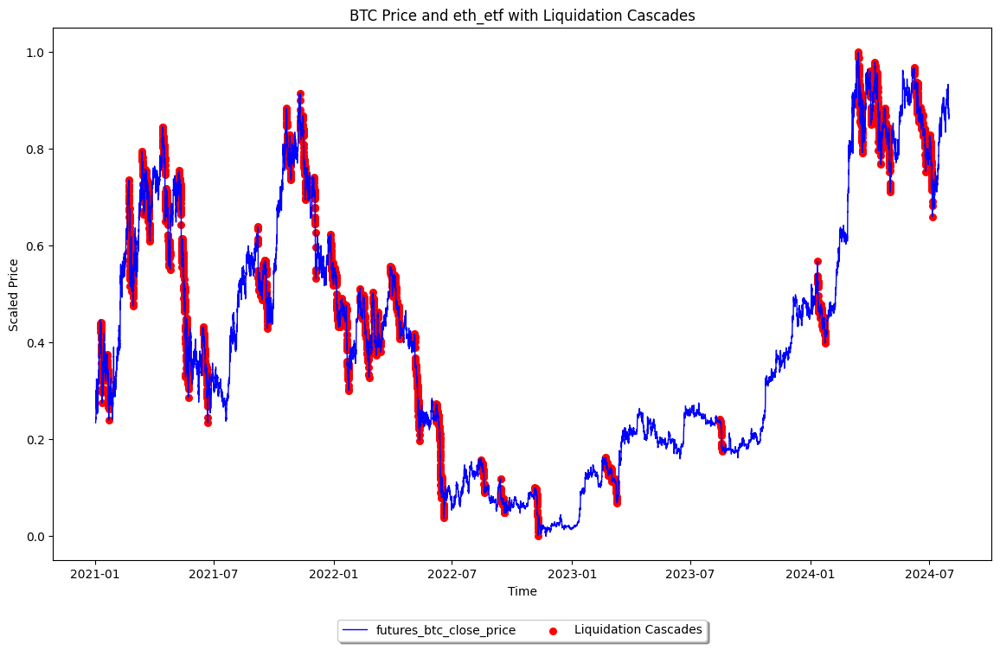

In [90]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and eth_etf with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

This graph displays the relationship between the BTC futures close price (blue line) and liquidation cascades (red dots), along with the ETH ETF (which isn’t visible in this version). The blue line represents the BTC futures close price over time, and the red dots indicate instances of liquidation cascades. Notably, these red dots cluster around significant drops in the blue line, demonstrating a direct correlation between sharp price declines and increased liquidation events. The intensity and frequency of the red dots during these downturns highlight the cascading effect where one liquidation can trigger subsequent liquidations, leading to more pronounced price drops. In periods where the blue line is more stable or rising, the absence of red dots indicates fewer liquidation events, suggesting that the market is less stressed.


### 3.3.26. Futures BTC Funding Rate

* Correlation: 0.320 - Moderate positive correlation.
* XGBoost: Moderate importance, contributes to predictions.
* Permutation Importance: Low importance, minor effect on the model.
* Mutual Information: Moderate information gain.

##### futures_btc_funding_rate has a moderate positive correlation with the target and provides valuable information, though it has a relatively minor impact on model performance.

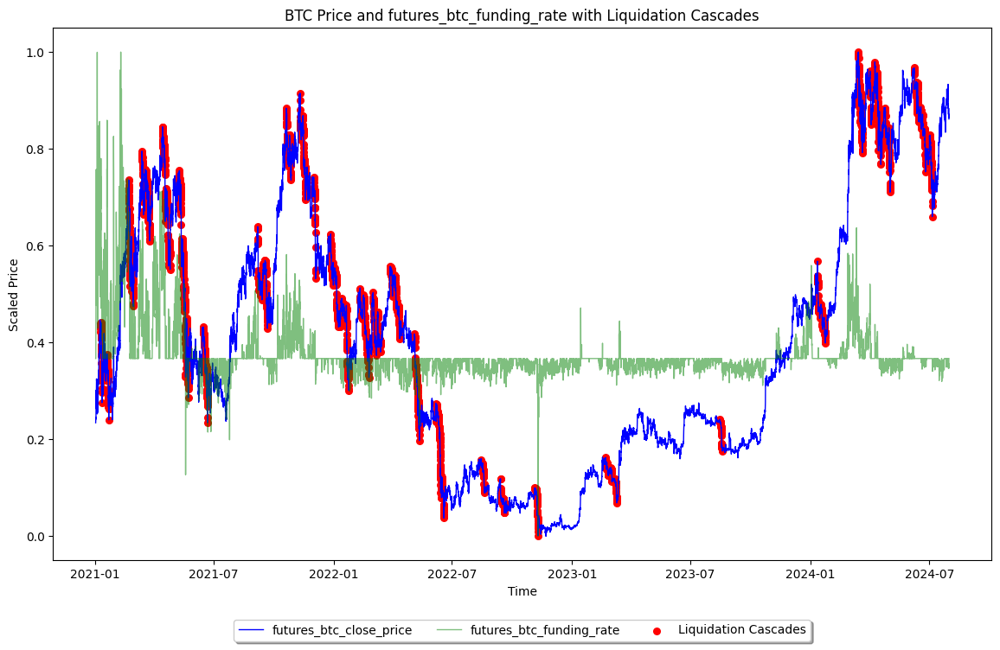

In [91]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_btc_funding_rate'], color='green', linewidth=1, alpha=0.5, label='futures_btc_funding_rate')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and futures_btc_funding_rate with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green line shows that when the funding rate is highly positive, there are often price drops, leading to liquidation events indicated by the red dots. As the funding rate fluctuates, it appears to correlate with significant price movements; a high positive funding rate can indicate an overheated market, often followed by sharp corrections and liquidations. Conversely, a negative funding rate tends to stabilize or slightly increase the BTC price, as seen in the periods with fewer red dots and steadier price movements.

### 3.3.27. Futures ETH Funding Rate

* Correlation: 0.286 - Moderate positive correlation.
* XGBoost: Low to moderate importance.
* Permutation Importance: Very low importance, minimal impact.
* Mutual Information: Moderate information gain.
##### futures_eth_funding_rate shows moderate correlation and information gain but has a limited effect on the model’s overall performance.

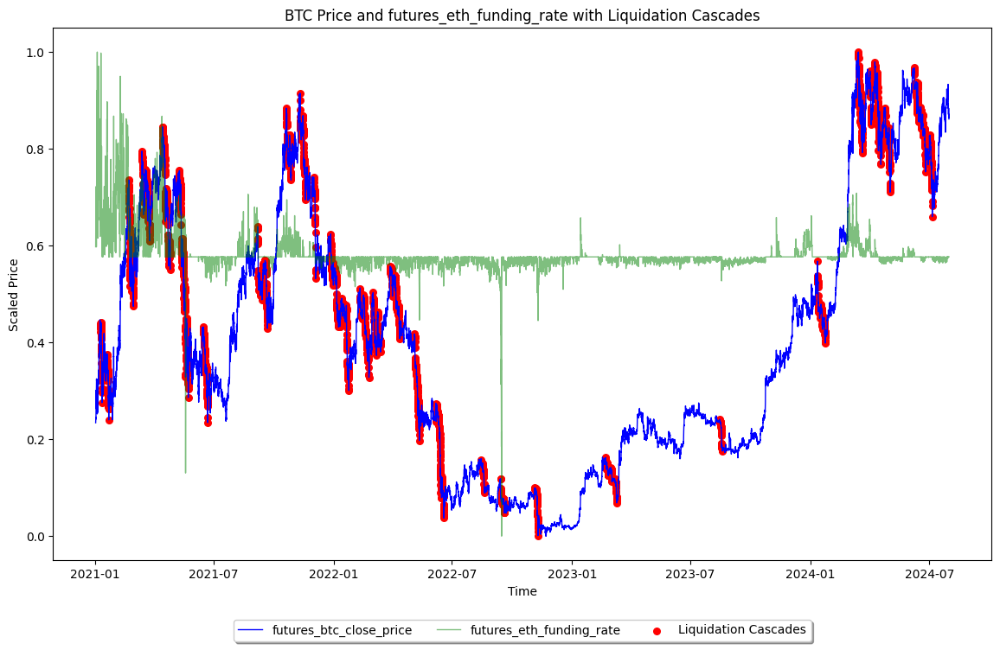

In [92]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['futures_eth_funding_rate'], color='green', linewidth=1, alpha=0.5, label='futures_eth_funding_rate')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots

plt.title('BTC Price and futures_eth_funding_rate with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green line, representing the funding rate for Ethereum futures, demonstrates a pattern where high positive funding rates often coincide with sharp BTC price drops, leading to increased liquidation events. This can be observed particularly in the earlier periods of the graph where the spikes in the funding rate are followed by significant declines in BTC price and clustering of red dots. Conversely, periods with a neutral or negative funding rate tend to show more stability in BTC prices with fewer liquidation events, suggesting a stabilizing effect when the funding rate is low or negative.

### 3.3.28. BTC Futures to Spot Price Ratio

* Correlation: 0.386 - Moderate positive correlation.
* XGBoost: Moderate importance.
* Permutation Importance: Very low impact.
* Mutual Information: Moderate information gain.

##### btc_futures_to_spot shows a moderate positive correlation with the target, suggesting some predictive value, although its importance varies across metrics.

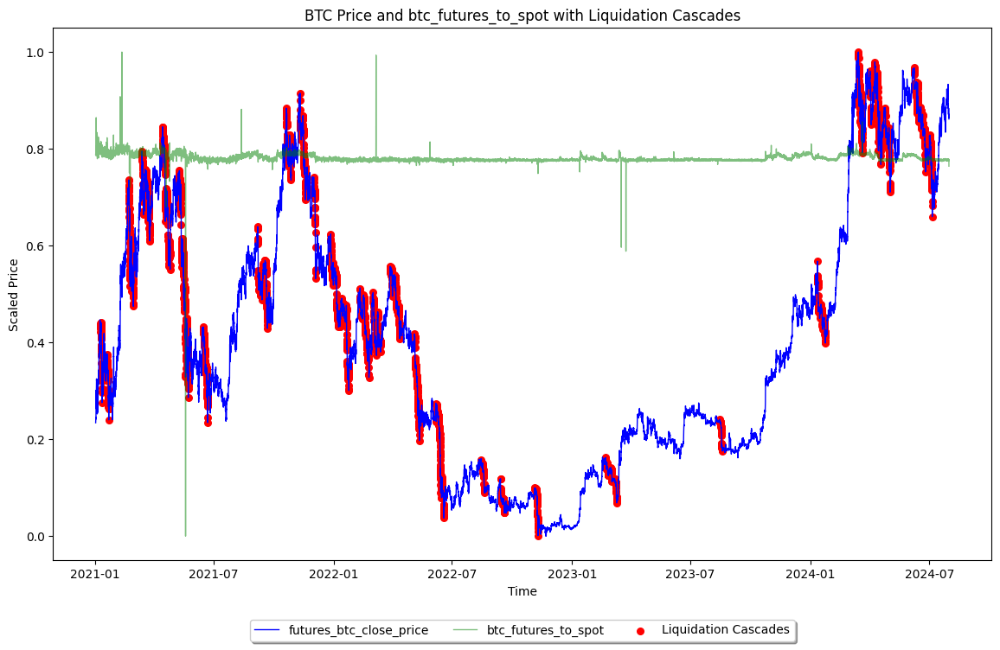

In [93]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['btc_futures_to_spot'], color='green', linewidth=1, alpha=0.5, label='btc_futures_to_spot')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and btc_futures_to_spot with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green line representing btc_futures_to_spot shows occasional spikes and dips, indicating moments where the futures price deviates significantly from the spot price. These deviations tend to occur before or during sharp declines in the futures_btc_close_price, as indicated by the blue line. The red dots marking liquidation_cascades are often clustered around these periods of deviation, suggesting that large discrepancies between futures and spot prices can precede or coincide with liquidation events, which are typically associated with sharp price drops. Overall, btc_futures_to_spot appears to be a leading indicator of market instability, with significant implications for both price movements and liquidation cascades.

### 3.3.28. ETH Futures to Spot Price Ratio

* Correlation: 0.282 - Moderate positive correlation.
* XGBoost: Moderate importance.
* Permutation Importance: Low impact.
* Mutual Information: Moderate information gain.

##### eth_futures_to_spot contributes moderately to the model, with some predictive value across different evaluation methods.


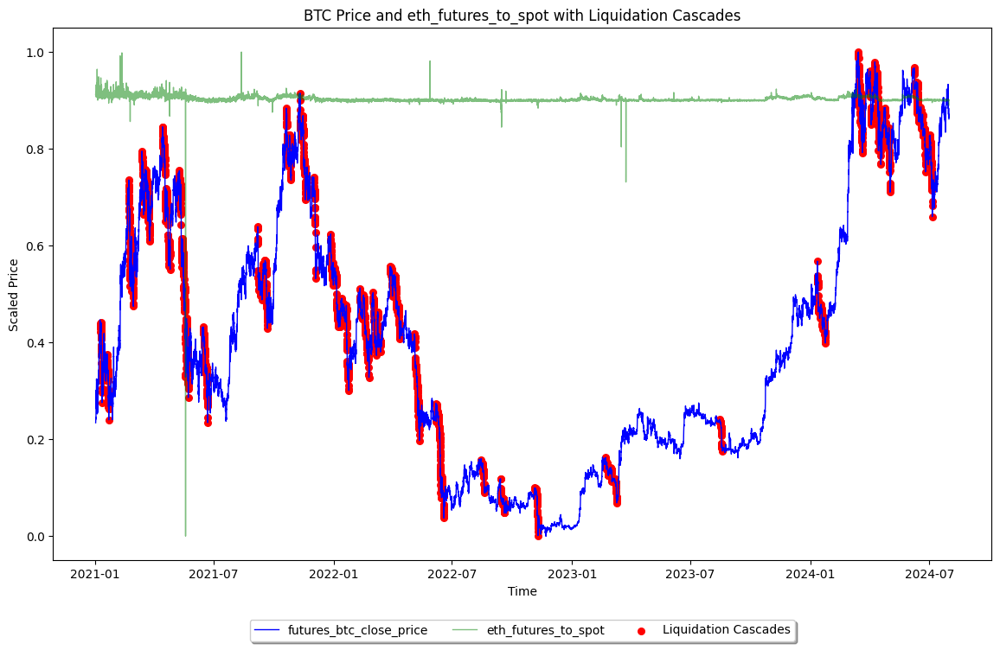

In [94]:
plt.figure(figsize=(14, 8))
plt.plot(minmax_df.index, minmax_df['futures_btc_close_price'], color='blue', linewidth=1, label='futures_btc_close_price')
plt.plot(minmax_df.index, minmax_df['eth_futures_to_spot'], color='green', linewidth=1, alpha=0.5, label='eth_futures_to_spot')
plt.scatter(minmax_df[minmax_df['liquidation_cascades'] == 1].index, 
            minmax_df[minmax_df['liquidation_cascades'] == 1]['futures_btc_close_price'], 
            color='red', s=30, label='Liquidation Cascades')  # Increased 's' value for larger dots


plt.title('BTC Price and eth_futures_to_spot with Liquidation Cascades')
plt.xlabel('Time')
plt.ylabel('Scaled Price')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.show()

The green line represents the eth_futures_to_spot ratio, showing occasional spikes where the futures price diverges significantly from the spot price. These divergences are often followed or accompanied by sharp drops in the futures_btc_close_price (blue line). The red dots, representing liquidation_cascades, tend to cluster around these periods of divergence, indicating that large differences between Ethereum futures and spot prices may trigger liquidation events, especially during volatile market conditions. This suggests that the eth_futures_to_spot ratio can be a significant indicator of potential instability in the market, affecting both price movements and the likelihood of liquidation cascades.

### 3.4. Feature Selection Based on The Graphs and Analyses (for futures_btc_close_price)

### 3.4.1. Removing futures_eth_close_price

Futures ETH price is very closely related to Futures BTC Price. Market movements generally affect both assets in the same way. Temporal market movements first move BTC, and then ETH prices adapt to this movement. Although this situation is seen as a short-term opportunity for investors, sometimes the opposite scenario may occur or both assets may react at the same time. In a situation where there is such intense fit and mobility, using ETH price as an independent variable in future BTC price prediction may cause overfitting in future modeling. For this reason, removing the futures ETH price from the dataset is suitable for making predictions that are more compatible with the real world.

In [95]:
minmax_scaled_price = minmax_df.drop(columns='futures_eth_close_price', inplace=False)
minmax_scaled_price.to_csv('minmax_scaled_price.csv', index=False)

In [96]:
prediction_scaled_price = prediction_df.drop(columns='futures_eth_close_price', inplace=False)
prediction_scaled_price.to_csv('prediction_scaled_price.csv', index=False)

### 3.4.2. Removing Features in terms of Their Weakness

It is removed from the dataset because its relationship with the target value 'futures btc_close_price', hence 'liquidation cascades', is quite weak compared to other variables.

In [97]:
columns_to_delete = ['futures_btc_dollar_volume', 'futures_btc_liquidations_coin_volume',
                     'spot_eth_dollar_volume', 'spot_eth_total_trades', 'futures_eth_total_trades',
                     'spot_eth_coin_volume', 'futures_eth_coin_volume', 'spot_btc_total_trades',
                     'futures_btc_liquidations_coin_volume', 'futures_eth_liquidations_coin_volume',
                     'futures_eth_dollar_volume', 'futures_btc_total_trades', 'spot_btc_CVD', 'spot_eth_CVD',
                     'spot_btc_dollar_volume']

prediction_df= prediction_df.drop(columns = columns_to_delete, errors='ignore')
minmax_df= minmax_df.drop(columns = columns_to_delete, errors='ignore')

In [98]:
minmax_df.to_csv('minmax_scaled_price.csv', index=False)

In [99]:
prediction_df.to_csv('prediction_scaled_price.csv', index=False)

### 3.4.3. ETF Event Data

Although the correlation and statistical significance of both BTC and ETH ETF events with the target feature ‘futures_btc_close_price’ are close to zero, they are events that investors should consider in the context of liquidation cascades. As observed in the above charts, liquidation cascades in market prices have generally been observed during or after ETF events. While these cascades are generally downward, some ETF events have also been followed by sudden upward spikes (short position liquidations). Investors should closely monitor their positions during and before these events and evaluate them in conjunction with other metrics. For these critical reasons, ETF event date data should not be removed from the dataset. It can serve as an important warning signal for future models related to liquidation cascades.

In [100]:
cor_btc = prediction_df
correlation_matrix = cor_btc.corr()
target_correlation = correlation_matrix['futures_btc_close_price'].sort_values(ascending=False)

with pd.option_context('display.max_rows', None):
    print(target_correlation)

futures_btc_close_price                 1.000000
futures_eth_close_price                 0.822552
btc_futures_to_spot                     0.386361
futures_btc_funding_rate                0.320078
futures_eth_funding_rate                0.286436
eth_futures_to_spot                     0.282220
liquidation_cascades                    0.221141
volatility                              0.087102
log_returns                             0.010335
eth_etf                                 0.006500
btc_etf                                 0.005272
futures_btc_coin_volume                -0.224072
futures_eth_coin_open_interest_close   -0.398240
spot_btc_coin_volume                   -0.414169
futures_eth_CVD                        -0.426634
futures_btc_CVD                        -0.434872
futures_btc_coin_open_interest_close   -0.621279
Name: futures_btc_close_price, dtype: float64


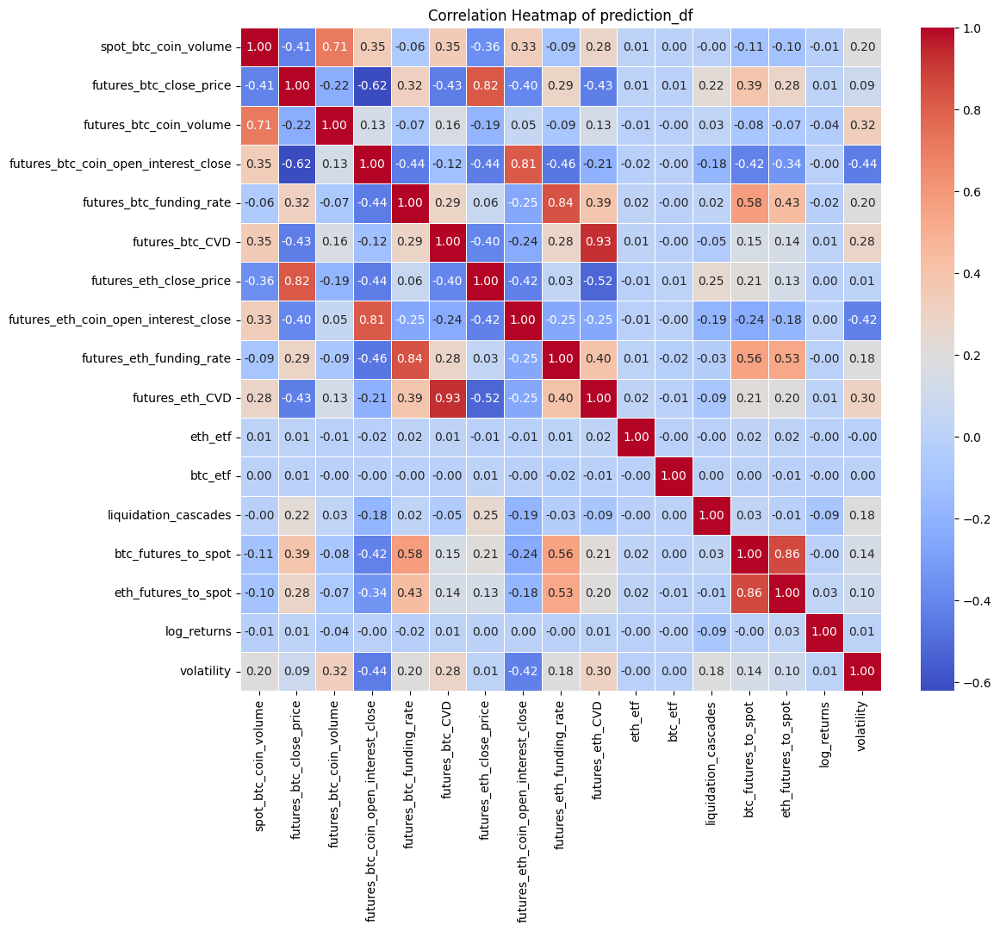

In [101]:
correlation_matrix = prediction_df.corr()


plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of prediction_df')
plt.show()

In summary of Feature Selection, there are only independent variables left in the dataset that are thought to not make predictions disconnected from the real world and that can help predict Bitcoin's futures price consistently in the future and are important for liquidation cascades.

The effect of some variables on the target variable in the correlation map is very small. These are the binary features 'eth_etf', 'btc_etf' and 'liquidation_cascades', which are particularly important for liquidation cascades but are not significantly meaningful for price prediction.

### 3.5. Feature Selection Based on The Graphs and Analyses (for log_returns)

Dropping features are detected by their weakness regarding to analysis and the graphs

In [104]:
columns_to_delete = ['futures_btc_dollar_volume', 'futures_btc_liquidations_coin_volume',
                     'spot_eth_dollar_volume', 'spot_eth_total_trades', 'futures_eth_total_trades',
                     'spot_eth_coin_volume', 'futures_eth_coin_volume', 'spot_btc_total_trades',
                     'futures_btc_liquidations_coin_volume', 'futures_eth_liquidations_coin_volume',
                     'futures_eth_dollar_volume', 'futures_btc_total_trades', 'spot_btc_CVD', 'spot_eth_CVD',
                     'spot_btc_dollar_volume']

prediction_df= prediction_df.drop(columns = columns_to_delete, errors='ignore')
minmax_df= minmax_df.drop(columns = columns_to_delete, errors='ignore')

In [106]:
minmax_df.to_csv('minmax_scaled_log_returns.csv', index=False)

In [110]:
prediction_df.to_csv('prediction_scaled_log_returns.csv', index=False)

In [130]:
log_returns = pd.read_csv("prediction_scaled_log_returns.csv")
price = pd.read_csv("prediction_scaled_price.csv")

In [132]:
log_returns.columns

Index(['spot_btc_coin_volume', 'futures_btc_close_price',
       'futures_btc_coin_volume', 'futures_btc_coin_open_interest_close',
       'futures_btc_funding_rate', 'futures_btc_CVD',
       'futures_eth_close_price', 'futures_eth_coin_open_interest_close',
       'futures_eth_funding_rate', 'futures_eth_CVD', 'eth_etf', 'btc_etf',
       'liquidation_cascades', 'btc_futures_to_spot', 'eth_futures_to_spot',
       'log_returns', 'volatility'],
      dtype='object')

In [133]:
price.columns

Index(['spot_btc_coin_volume', 'futures_btc_close_price',
       'futures_btc_coin_volume', 'futures_btc_coin_open_interest_close',
       'futures_btc_funding_rate', 'futures_btc_CVD',
       'futures_eth_close_price', 'futures_eth_coin_open_interest_close',
       'futures_eth_funding_rate', 'futures_eth_CVD', 'eth_etf', 'btc_etf',
       'liquidation_cascades', 'btc_futures_to_spot', 'eth_futures_to_spot',
       'log_returns', 'volatility'],
      dtype='object')

## 4. Detailed Feature Engineering (Lag Score Detecetion & Dropping Weakness Features)

prediction_df is reloaded and its index is set to date time.

In [37]:
prediction_df = pd.read_csv("prediction_scaled_log_returns.csv")

In [38]:
prediction_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31339 entries, 0 to 31338
Data columns (total 17 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   spot_btc_coin_volume                  31339 non-null  float64
 1   futures_btc_close_price               31339 non-null  float64
 2   futures_btc_coin_volume               31339 non-null  float64
 3   futures_btc_coin_open_interest_close  31339 non-null  float64
 4   futures_btc_funding_rate              31339 non-null  float64
 5   futures_btc_CVD                       31339 non-null  float64
 6   futures_eth_close_price               31339 non-null  float64
 7   futures_eth_coin_open_interest_close  31339 non-null  float64
 8   futures_eth_funding_rate              31339 non-null  float64
 9   futures_eth_CVD                       31339 non-null  float64
 10  eth_etf                               31339 non-null  int64  
 11  btc_etf        

In [39]:
start_date = '2021-01-02 00:00:00'
end_date = '2024-07-30 18:00:00'
freq = 'H'  
datetime_index = pd.date_range(start=start_date, end=end_date, freq=freq)
prediction_df = prediction_df.set_index(datetime_index)

In [41]:
prediction_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 31339 entries, 2021-01-02 00:00:00 to 2024-07-30 18:00:00
Freq: H
Data columns (total 17 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   spot_btc_coin_volume                  31339 non-null  float64
 1   futures_btc_close_price               31339 non-null  float64
 2   futures_btc_coin_volume               31339 non-null  float64
 3   futures_btc_coin_open_interest_close  31339 non-null  float64
 4   futures_btc_funding_rate              31339 non-null  float64
 5   futures_btc_CVD                       31339 non-null  float64
 6   futures_eth_close_price               31339 non-null  float64
 7   futures_eth_coin_open_interest_close  31339 non-null  float64
 8   futures_eth_funding_rate              31339 non-null  float64
 9   futures_eth_CVD                       31339 non-null  float64
 10  eth_etf                               3

### 4.1. ACF PACF Analysis

ACF and PACF Plots - spot_btc_coin_volume


<Figure size 1000x500 with 0 Axes>

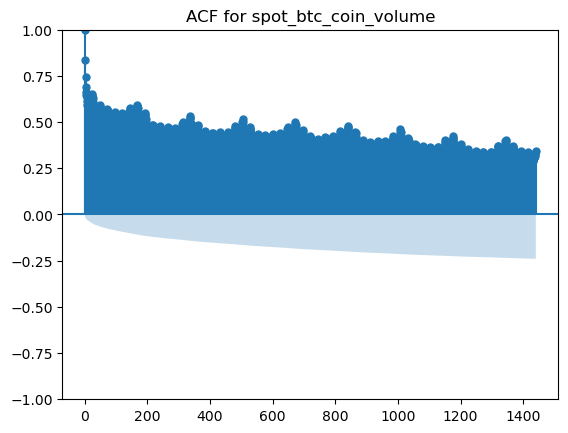

<Figure size 1000x500 with 0 Axes>

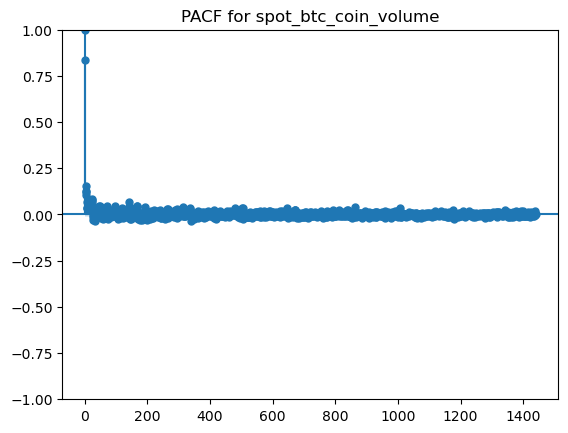

ACF and PACF Plots - futures_btc_coin_volume


<Figure size 1000x500 with 0 Axes>

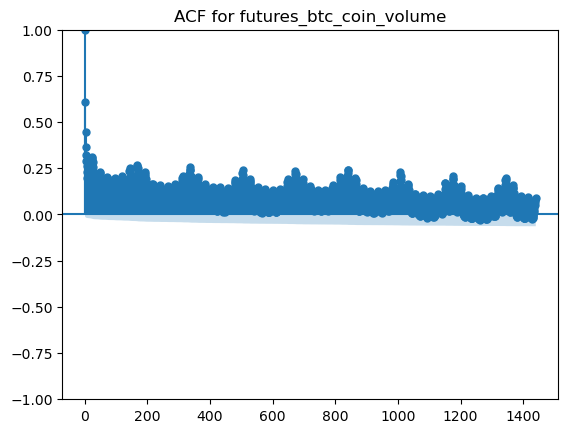

<Figure size 1000x500 with 0 Axes>

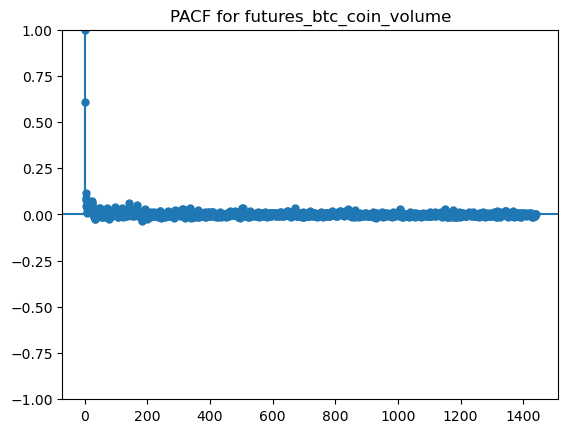

ACF and PACF Plots - futures_btc_coin_open_interest_close


<Figure size 1000x500 with 0 Axes>

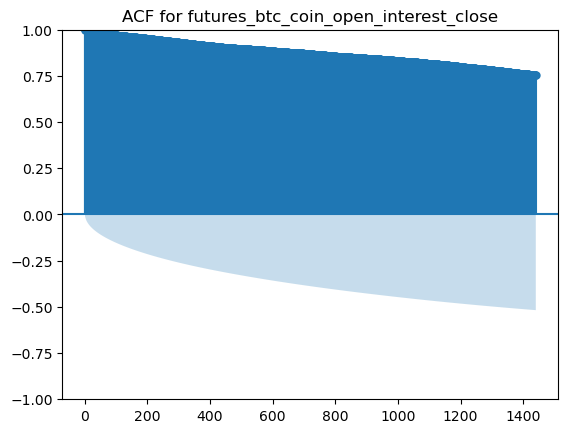

<Figure size 1000x500 with 0 Axes>

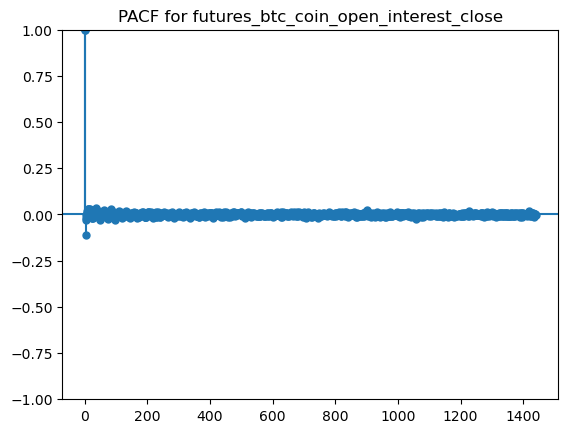

ACF and PACF Plots - futures_btc_funding_rate


<Figure size 1000x500 with 0 Axes>

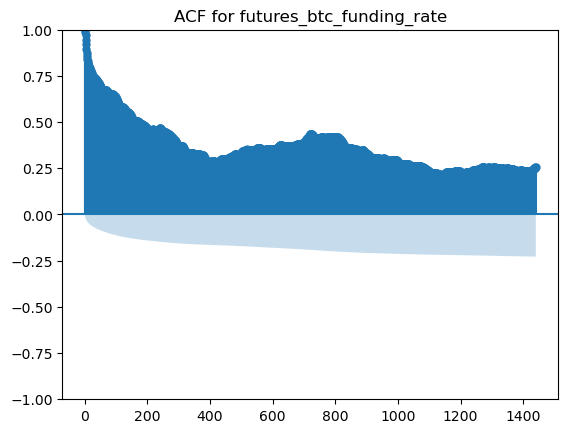

<Figure size 1000x500 with 0 Axes>

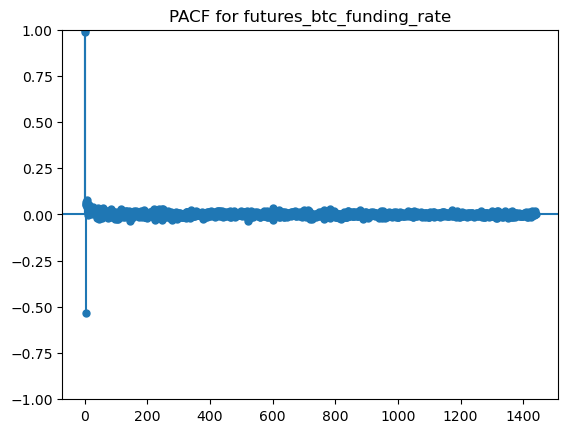

ACF and PACF Plots - futures_btc_CVD


<Figure size 1000x500 with 0 Axes>

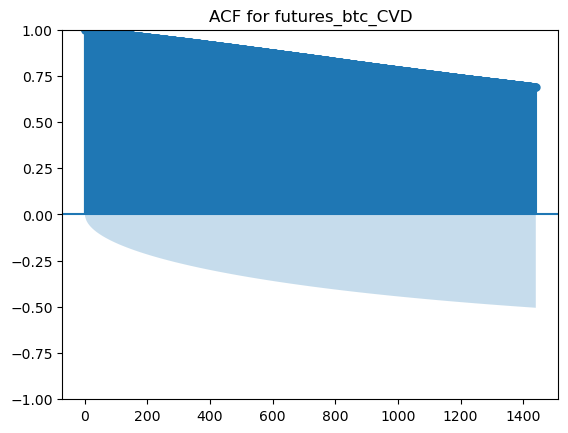

<Figure size 1000x500 with 0 Axes>

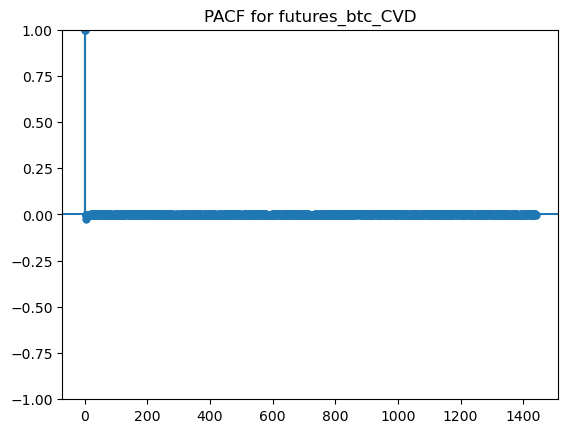

ACF and PACF Plots - futures_eth_coin_open_interest_close


<Figure size 1000x500 with 0 Axes>

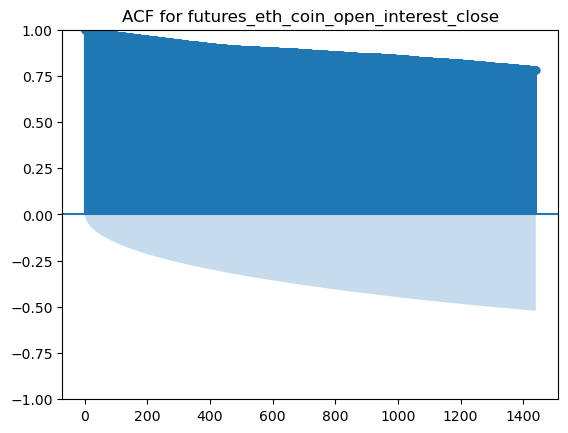

<Figure size 1000x500 with 0 Axes>

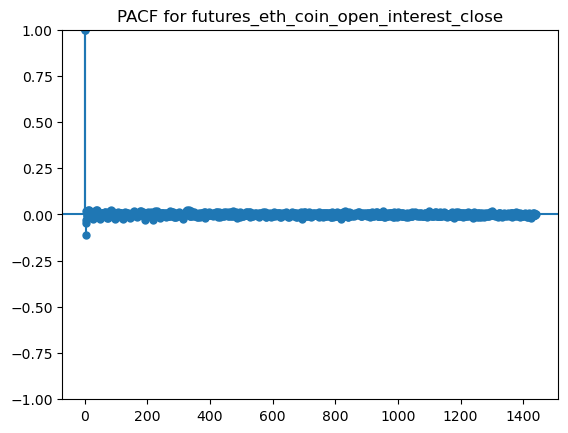

ACF and PACF Plots - futures_eth_funding_rate


<Figure size 1000x500 with 0 Axes>

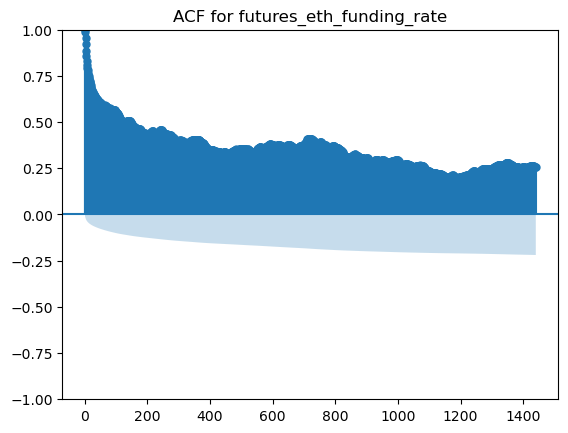

<Figure size 1000x500 with 0 Axes>

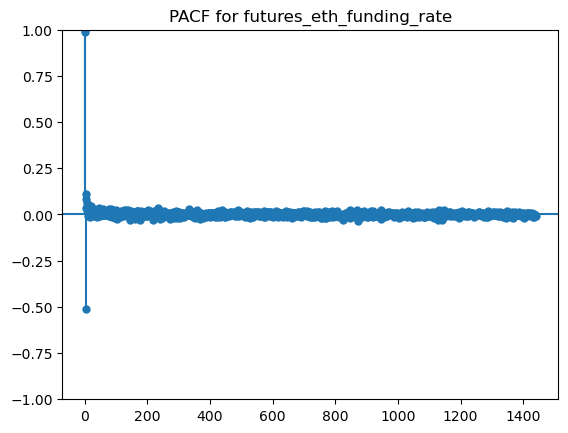

ACF and PACF Plots - futures_eth_CVD


<Figure size 1000x500 with 0 Axes>

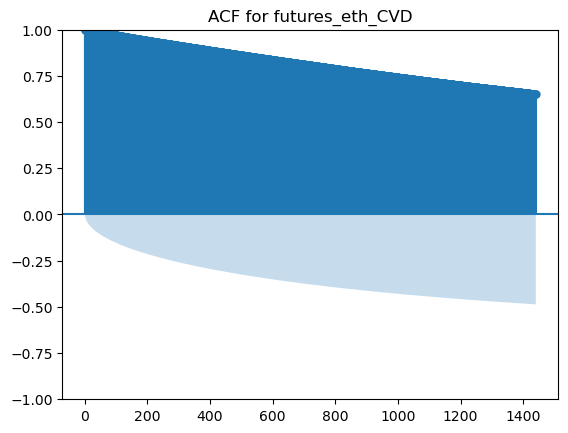

<Figure size 1000x500 with 0 Axes>

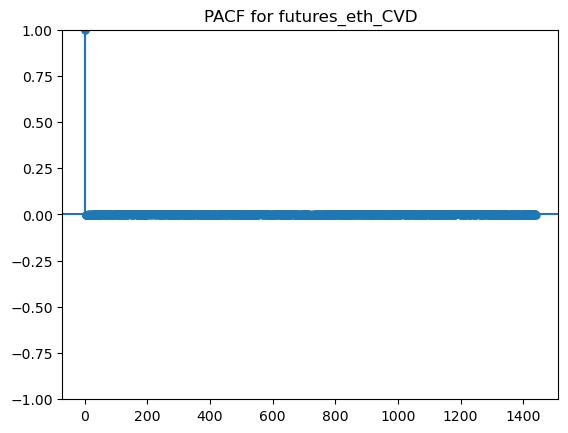

ACF and PACF Plots - btc_futures_to_spot


<Figure size 1000x500 with 0 Axes>

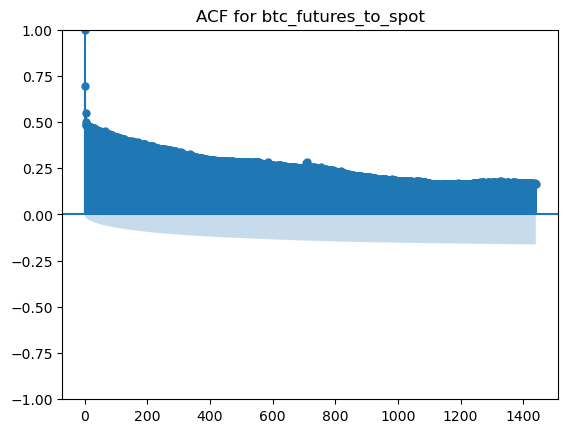

<Figure size 1000x500 with 0 Axes>

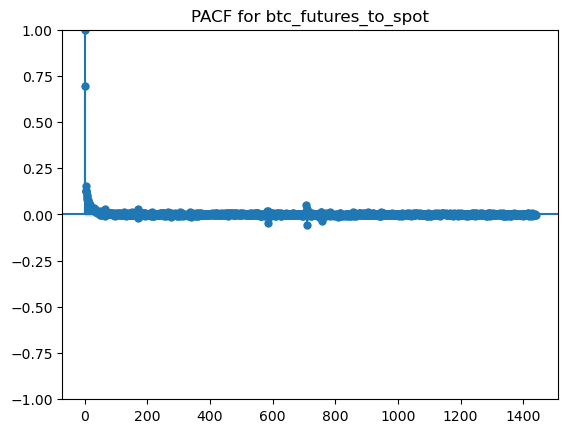

ACF and PACF Plots - eth_futures_to_spot


<Figure size 1000x500 with 0 Axes>

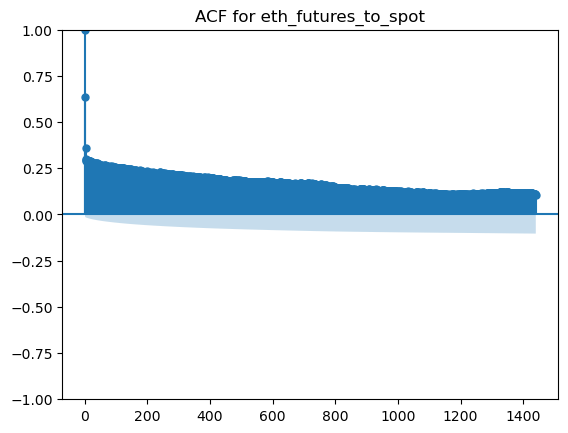

<Figure size 1000x500 with 0 Axes>

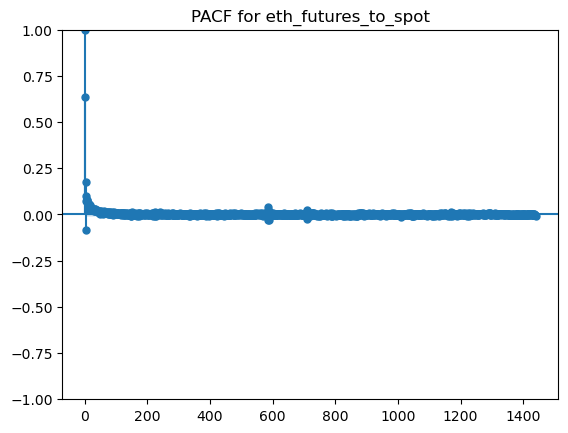

ACF and PACF Plots - log_returns


<Figure size 1000x500 with 0 Axes>

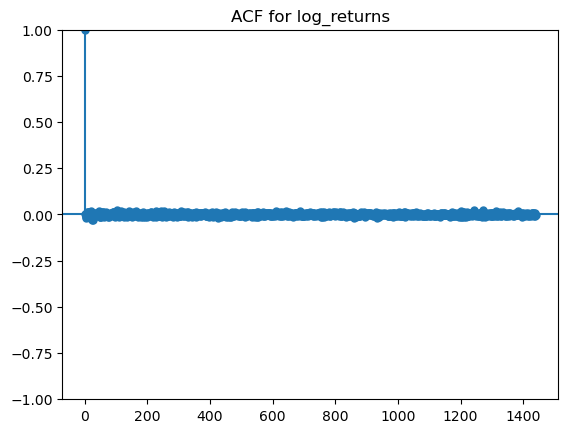

<Figure size 1000x500 with 0 Axes>

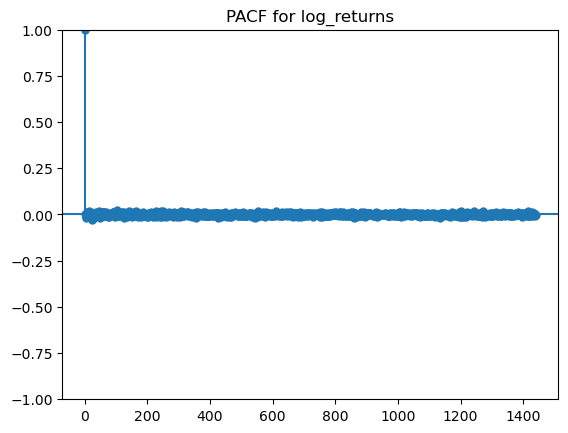

ACF and PACF Plots - volatility


<Figure size 1000x500 with 0 Axes>

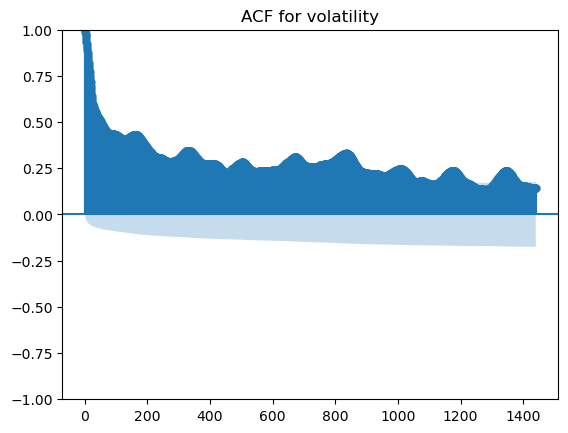

<Figure size 1000x500 with 0 Axes>

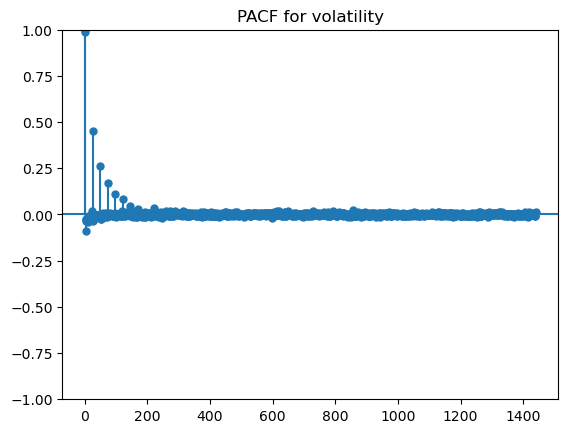

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Columns to be used (excluding binary columns)
columns_to_use = [
    'spot_btc_coin_volume', 'futures_btc_coin_volume',
    'futures_btc_coin_open_interest_close', 'futures_btc_funding_rate',
    'futures_btc_CVD', 'futures_eth_coin_open_interest_close',
    'futures_eth_funding_rate', 'futures_eth_CVD',
    'btc_futures_to_spot', 'eth_futures_to_spot', 'log_returns',
    'volatility'
]

# Filtering the data for ACF and PACF analysis
data_to_analyze = prediction_df[columns_to_use]

# Plotting ACF and PACF graphs for each column
for column in data_to_analyze.columns:
    print(f'ACF and PACF Plots - {column}')
    
    # ACF Plot
    plt.figure(figsize=(10, 5))
    plot_acf(data_to_analyze[column], lags=1440)
    plt.title(f'ACF for {column}')
    plt.show()
    
    # PACF Plot
    plt.figure(figsize=(10, 5))
    plot_pacf(data_to_analyze[column], lags=1440)
    plt.title(f'PACF for {column}')
    plt.show()

The ACF (Autocorrelation Function) and PACF (Partial Autocorrelation Function) plots provide critical insights into the temporal dependencies within the variables of the dataset. For most variables, including futures-related features, there is a strong positive autocorrelation at initial lags, which gradually decreases over time. This pattern suggests that recent past values significantly influence current values. The PACF plots reinforce this observation, indicating that most predictive information is contained within the first few lags. However, as the lag increases, the influence diminishes, implying that distant past values have less predictive power. Therefore, using lower to moderate lag values (e.g., t-1, t-2, t-3) in predictive models would likely yield the best results.


Specific analysis of the ACF and PACF plots for log returns and volatility reveals distinct patterns. For log returns, there is a high autocorrelation at lag 0, followed by nearly zero autocorrelation at subsequent lags, indicating a lack of memory in the data. In contrast, the ACF plot for volatility shows a slower decay, suggesting that volatility is more persistent over time. The PACF plot for volatility supports this, with significant autocorrelations at multiple lags. These observations highlight the importance of adjusting lag structures depending on the variable, with recent past values being critical for log returns and a broader range of lagged values being beneficial for volatility predictions.

### 4.2. Granger Causality Test

Given the high computational cost and time involved in conducting Granger causality tests on hourly data, we have chosen to re-sample our dataset to daily frequency. This approach balances the need for robust causality analysis with the practical constraints of computational resources, allowing us to effectively apply Granger causality to identify the key drivers of liquidation cascades in the cryptocurrency market. 

In [8]:
predictions_daily = prediction_df.resample('D').last()

In [10]:
# log_returns and volatility features have to be recalculated. Dataset's frequency was changed as daily,
# for that reason, log_returns and volatility have to be calculated daily.
predictions_daily = predictions_daily.drop(columns=['log_returns', 'volatility'])

In [12]:
predictions_daily['log_returns'] = np.log(predictions_daily['futures_btc_close_price'] / predictions_daily['futures_btc_close_price'].shift(1))

predictions_daily['volatility'] = predictions_daily['log_returns'].rolling(window=10).std()

In [13]:
predictions_daily.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1306 entries, 2021-01-02 to 2024-07-30
Freq: D
Data columns (total 17 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   spot_btc_coin_volume                  1306 non-null   float64
 1   futures_btc_close_price               1306 non-null   float64
 2   futures_btc_coin_volume               1306 non-null   float64
 3   futures_btc_coin_open_interest_close  1306 non-null   float64
 4   futures_btc_funding_rate              1306 non-null   float64
 5   futures_btc_CVD                       1306 non-null   float64
 6   futures_eth_close_price               1306 non-null   float64
 7   futures_eth_coin_open_interest_close  1306 non-null   float64
 8   futures_eth_funding_rate              1306 non-null   float64
 9   futures_eth_CVD                       1306 non-null   float64
 10  eth_etf                               1306 non-null   int6

In [14]:
predictions_daily = predictions_daily.dropna()

In [15]:
# Features to be excluded: 'eth_etf', 'btc_etf', 'liquidation_cascades'
excluded_features = ['eth_etf', 'btc_etf', 'liquidation_cascades']
target = 'log_returns'

# Selecting the features to include in the test
features = [col for col in predictions_daily.columns if col not in excluded_features and col != target]

# Granger Causality Test
maxlag = 60  # 60-day lag (approximately 2 months)

# Dictionary to store the results
results = {}

# Performing Granger Causality Test for each feature
for feature in features:
    print(f"\nTesting Granger Causality between {feature} and {target}")
    test_result = grangercausalitytests(predictions_daily[[target, feature]], maxlag=maxlag, verbose=False)
    results[feature] = test_result

# Reviewing the results
for feature, result in results.items():
    print(f"\nFeature: {feature}")
    for lag in result:
        print(f"Lag {lag} p-value: {result[lag][0]['ssr_ftest'][1]:.4f}")  # F-test p-value


Testing Granger Causality between spot_btc_coin_volume and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between futures_btc_close_price and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between futures_btc_coin_volume and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between futures_btc_coin_open_interest_close and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between futures_btc_funding_rate and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between futures_btc_CVD and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between futures_eth_close_price and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between futures_eth_coin_open_interest_close and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between futures_eth_funding_rate and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between futures_eth_CVD and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between btc_futures_to_spot and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between eth_futures_to_spot and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Testing Granger Causality between volatility and log_returns


/Users/alperenunal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Feature: spot_btc_coin_volume
Lag 1 p-value: 0.1100
Lag 2 p-value: 0.2437
Lag 3 p-value: 0.2708
Lag 4 p-value: 0.2473
Lag 5 p-value: 0.2233
Lag 6 p-value: 0.3123
Lag 7 p-value: 0.3271
Lag 8 p-value: 0.4850
Lag 9 p-value: 0.5784
Lag 10 p-value: 0.6444
Lag 11 p-value: 0.6729
Lag 12 p-value: 0.7282
Lag 13 p-value: 0.7914
Lag 14 p-value: 0.8389
Lag 15 p-value: 0.6477
Lag 16 p-value: 0.6497
Lag 17 p-value: 0.6867
Lag 18 p-value: 0.7526
Lag 19 p-value: 0.8024
Lag 20 p-value: 0.7823
Lag 21 p-value: 0.5659
Lag 22 p-value: 0.6363
Lag 23 p-value: 0.6989
Lag 24 p-value: 0.7574
Lag 25 p-value: 0.8217
Lag 26 p-value: 0.8544
Lag 27 p-value: 0.8431
Lag 28 p-value: 0.8262
Lag 29 p-value: 0.8653
Lag 30 p-value: 0.8859
Lag 31 p-value: 0.8449
Lag 32 p-value: 0.8616
Lag 33 p-value: 0.8965
Lag 34 p-value: 0.9101
Lag 35 p-value: 0.9320
Lag 36 p-value: 0.9378
Lag 37 p-value: 0.8966
Lag 38 p-value: 0.9089
Lag 39 p-value: 0.8889
Lag 40 p-value: 0.8967
Lag 41 p-value: 0.8529
Lag 42 p-value: 0.8342
Lag 43 p-val

### 4.3. Lagged Cross-Correlation Analysis

The analysis will continue to be done with daily data, as in Granger Causality.

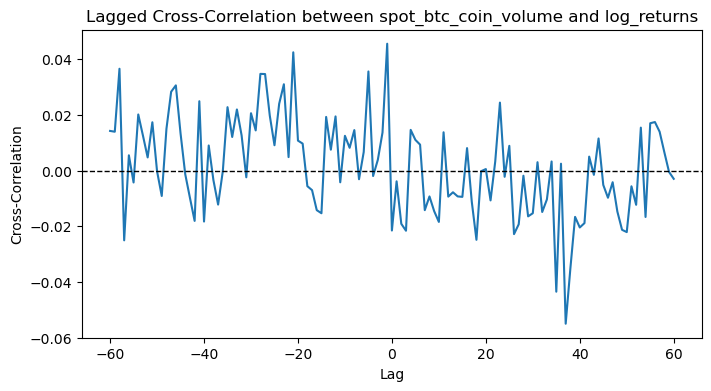

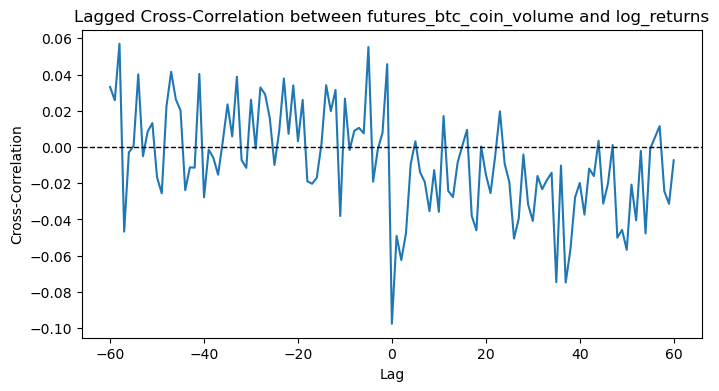

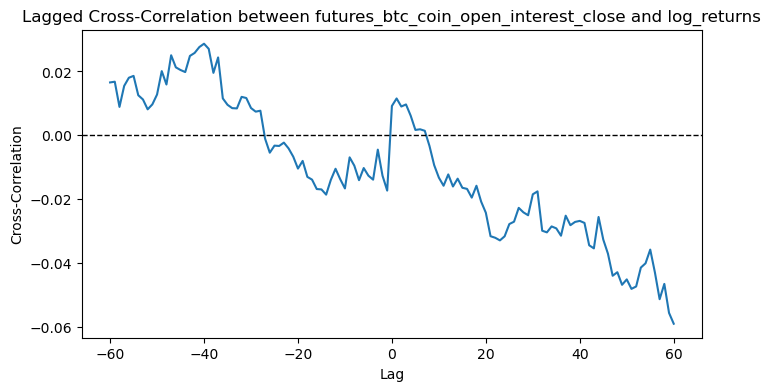

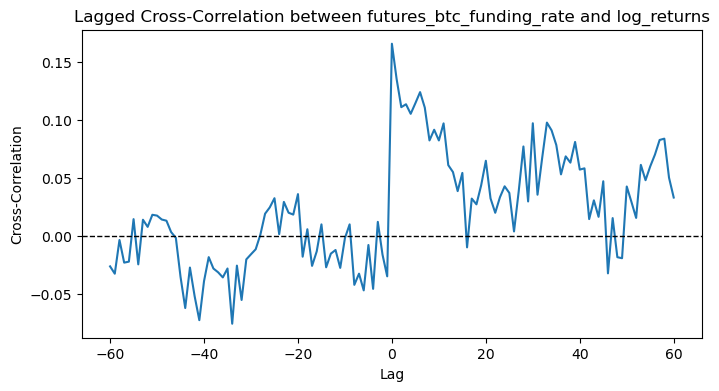

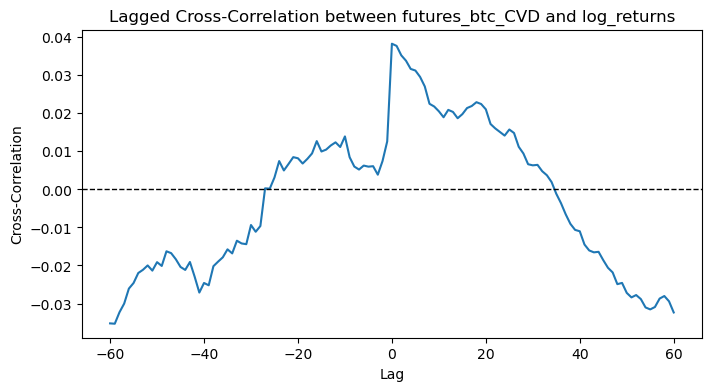

...

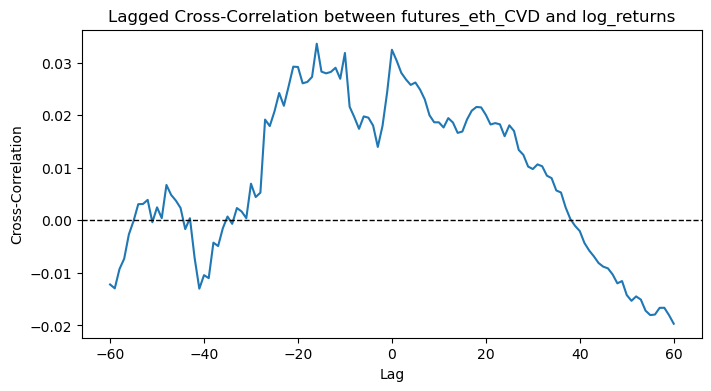

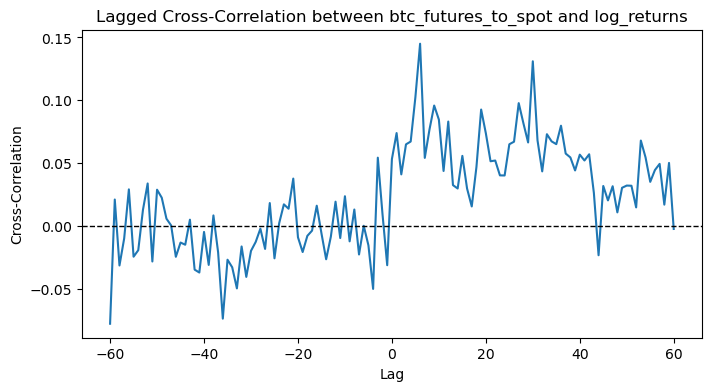

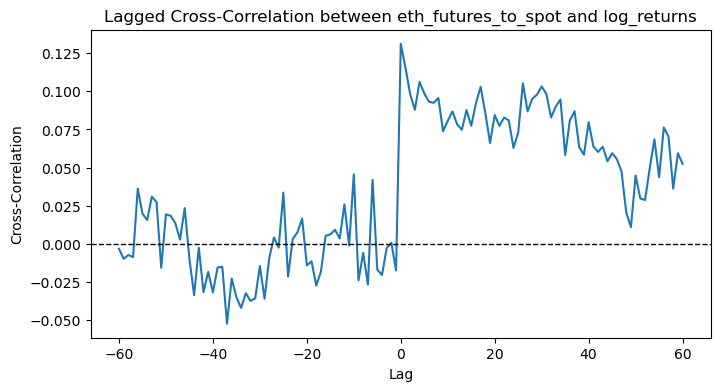

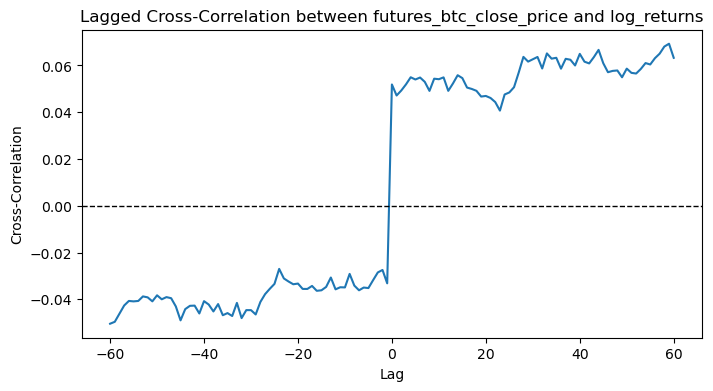

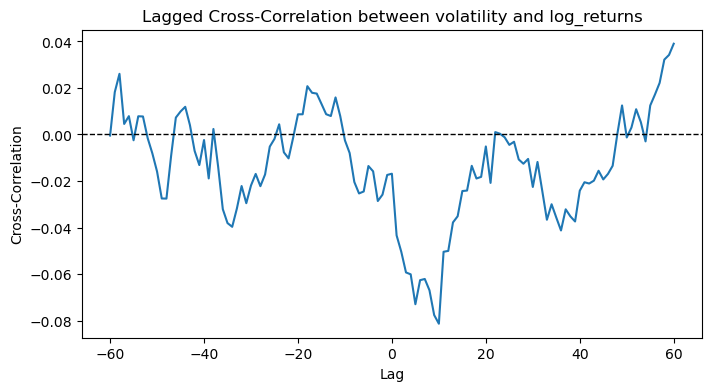

,spot_btc_coin_volume,futures_btc_coin_volume,futures_btc_coin_open_interest_close,futures_btc_funding_rate,futures_btc_CVD,futures_eth_coin_open_interest_close,futures_eth_funding_rate,futures_eth_CVD,btc_futures_to_spot,eth_futures_to_spot,futures_btc_close_price,volatility
-60,0.014233,0.033137,0.016550,-0.026041,-0.035220,0.032092,-0.015272,-0.012210,-0.077827,-0.003179,-0.050450,-0.000453
-59,0.013942,0.025818,0.016773,-0.032339,-0.035309,0.033034,-0.007351,-0.012947,0.021004,-0.009731,-0.049629,0.018221
-58,0.036573,0.057026,0.008890,-0.003345,-0.032296,0.031144,-0.010387,-0.009285,-0.031482,-0.007223,-0.046138,0.026090
-57,-0.025084,-0.046710,0.015462,-0.022825,-0.030019,0.031974,-0.023196,-0.007314,-0.009984,-0.008615,-0.042655,0.004531
-56,0.005471,-0.003002,0.018018,-0.021976,-0.026078,0.036448,0.062498,-0.002688,0.029085,0.036311,-0.040707,0.007882
...,...,...,...,...,...,...,...,...,...,...,...,...
56,0.017418,0.005297,-0.042958,0.070028,-0.030914,-0.027475,0.108292,-0.017932,0.044458,0.076263,0.063096,0.017158
57,0.013932,0.011532,-0.051296,0.082643,-0.028698,-0.029822,0.026879,-0.016653,0.049372,0.070354,0.065027,0.022192
58,0.006604,-0.024388,-0.046506,0.083757,-0.028028,-0.033877,0.012481,-0.016643,0.016932,0.036280,0.068065,0.032196
59,-0.000495,-0.031313,-0.055574,0.050194,-0.029419,-0.035908,0.045028,-0.018043,0.050128,0.059417,0.069290,0.034203


In [16]:
# Lagged cross-correlation function
def lagged_cross_correlation(x, y, max_lag):
    result = [x.corr(y.shift(lag)) for lag in range(-max_lag, max_lag + 1)]
    return np.array(result)

# Parameters
max_lag = 60  # Considering 60 lags as in the Granger causality test
target = 'log_returns'
features = ['spot_btc_coin_volume', 'futures_btc_coin_volume',
    'futures_btc_coin_open_interest_close', 'futures_btc_funding_rate',
    'futures_btc_CVD', 'futures_eth_coin_open_interest_close',
    'futures_eth_funding_rate', 'futures_eth_CVD',
    'btc_futures_to_spot', 'eth_futures_to_spot', 'futures_btc_close_price',
    'volatility']

# Performing Lagged Cross-Correlation Analysis
correlation_results = {}

for feature in features:
    cross_corr = lagged_cross_correlation(predictions_daily[feature], predictions_daily[target], max_lag)
    correlation_results[feature] = cross_corr

    # Plotting the results
    plt.figure(figsize=(8, 4))
    plt.plot(range(-max_lag, max_lag + 1), cross_corr)
    plt.title(f'Lagged Cross-Correlation between {feature} and {target}')
    plt.xlabel('Lag')
    plt.ylabel('Cross-Correlation')
    plt.axhline(0, color='black', linestyle='--', linewidth=1)
    plt.show()

# Reviewing the results
correlation_results_df = pd.DataFrame(correlation_results, index=range(-max_lag, max_lag + 1))
correlation_results_df

## 5. Final Selection of Predictive Features (Based on All the Analyses' Results Above)

### 5.1. Most Suitable Variables and Recommended Lag Levels

##### btc_futures_to_spot:
* Suggested Lag Levels: 1, 2, 3, 4, 5, 6
* Rationale: This variable consistently shows a strong positive correlation with futures_btc_close_price across various lag levels, especially at shorter lags. It is highly effective for short-term predictions and should be given priority in predictive models.

##### futures_btc_funding_rate:
* Suggested Lag Levels: 2, 3, 4, 5, 6, 7
* Rationale: The lagged impact of this variable is notably significant, particularly from lag 2 through 7. The Granger Causality test indicates that futures_btc_funding_rate has a considerable effect on futures_btc_close_price, making it a critical variable for improving forecast accuracy.

##### Volatility:
* Suggested Lag Levels: 2, 3, 4, 5, 6, 7, 8, 9
* Rationale: Volatility demonstrates a significant correlation with futures_btc_close_price at early lag levels, particularly up to lag 10. It should be incorporated into models where recent volatility is a relevant predictor, as it provides valuable insights into potential future price movements.


### 5.2. Variables Recommended for Use Without Lag

##### log_returns:
* Rationale: This variable is particularly effective for immediate predictions based on recent market movements. It should be employed without lag to capture the most current dynamics influencing the futures_btc_close_price.

##### futures_eth_funding_rate:
* Rationale: The low significance of this variable in the Granger Causality test suggests it is more suitable for use without lag. Utilising it in its immediate form may enhance the accuracy of predictions, especially in models focusing on short-term market behaviour.


### 5.3. Least Important Variables

##### futures_btc_coin_open_interest_close:
* Rationale: This variable did not demonstrate significant predictive power when lagged values were applied. Therefore, it is recommended to be utilised without lag to maintain any potential predictive relevance.

##### futures_btc_CVD:
* Rationale: The lagged effect of this variable shows a negative correlation with futures_btc_close_price, particularly at longer lags. Its contribution to predictive models is limited, and its application should be approached with caution, especially when using lagged values.

##### futures_btc_coin_volume:
* Rationale: This variable exhibits a negative correlation and low significance, indicating that its overall contribution to predictive models is minimal. Its application should be minimised, particularly when lagged values are considered.
